In [1]:
import numpy as np
from sacla import *
%matplotlib inline
import matplotlib.pyplot as plt
import scipy.signal as ss
import lmfit
from functools import *
import spectrumfit
import h5py
import matplotlib.pyplot as plt
from pathlib import Path
import re
%config Completer.use_jedi = False
try:
    import mkl_umath
    mkl_umath.use_in_numpy()
except ImportError:
    pass
%reload_ext autoreload
%aimport spectrumfit
%autoreload 1

In [2]:
l=log('sacla2020.csv')

In [3]:
l[:40]

,Run start,last run,Name,Target,Target Material,Pre-Run Comment,Post-Run Comment,Filter Oktal,Filter Dual,Distance_Dual,Distance_Oktal,focus y,p1,p2_stats,p2_thres1000,p2_thres1500,p2_thres2000,Att,Defocus
,#,#,Name,ID,Material,Text,Text,Material,Material,cm,cm,um,Path,Path,Path,Path,Path,mm Silicon,um
0,918261,918261,dark,NaN,NaN,dark run,NaN,None,None,100.0,43.0,-210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,918280,918289,background,2,None,Background recording. Motor is still scanning.,NaN,None,None,100.0,43.0,-210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,918308,918348,Cu20um_focus,3,Cu20um,NaN,On the dual there are photons with ~160ADU and...,None,None,100.0,43.0,-210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,918349,918368,Cu20um_defocus-500,3,Cu20um,NaN,NaN,None,None,100.0,43.0,-210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,918369,918413,Fe500nm_focus,4,Fe500nm,Try 0.5um iron foil. get back into focus. Also...,"Diffraction visible, see SLACK. Live analysis ...",None,None,100.0,43.0,-210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,918414,918456,Fe500nm_defocus-200,4,Fe500nm,moved out of focus (-200um),foil entirely shot\r\n,None,None,100.0,43.0,-210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,918457,918467,dark,none,none,dark runs for detector. no FEL,NaN,None,None,100.0,43.0,-210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,918468,918510,Fe10um_focus,6,Fe10um,NaN,NaN,None,None,100.0,43.0,-210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,918511,918551,Fe10um_defocus-400,6,Fe10um,moved out of focus (-400um),NaN,None,None,100.0,43.0,-210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# use raw h5

In [125]:
def gethist(images,gain=None,bg=None,**args):
    for img in images:
        if gain is not None:
            img=img*gain*3.65
        if bg is not None:
            img-=bg
        val,edge=np.histogram(img,**args)
        yield val

In [126]:
with h5py.File('/arcv1/UserData/gorkhover/TAIS2020/foils/bg/bg_918457_918467.h5') as bgfile:
    bg=np.array(bgfile['detector_2d_2']['mean'])

In [ ]:
for _,s in l[:20].iterrows():
    if 'Cu' in str(s['Name'][0]):
        E=8400
    elif 'Fe' in str(s['Name'][0]):
        E=6400
    else:
        print(s['Name'][0])
        continue
    if '500nm'  in str(s['Name'][0]):
        Escatter=run.photonEnergy.mean()
    else:
        Escatter=None
    r=int((s['Run start']+s['last run'])/2)-1
    run=saclarun(f'/arcv1/UserData//gorkhover/TAIS2020/foils/{r}.h5',Tais2020)
    

        
    hist=sum(gethist(run.detector_2d_2[:],gain=run.detector_2d_2.absolute_gain,bg=bg,range=[0,40000],bins=2001))
    hist=hist/(len(run.detector_2d_2)*np.size(run.detector_2d_2[0]))
    bins=np.linspace(0,40000,2001)+10
    f1,f2=spectrumfit.spectrumfit(bins,hist,Esignal=E,Escatter=Escatter,p=0.4,pscatter=1e-9,sigma=200)
    plt.semilogy(bins,10**f2.best_fit)
    plt.semilogy(bins,hist)
    plt.title(f'{s["Name"][0]}-{r}')
    plt.xlim(0,25000)
    #plt.ylim(1e-1,1e7)
    plt.show()
    print(f2.fit_report())
    print()
    print()
    

# use p1

## foils

In [39]:
import functools

def fitfile(fn, dettiles, Escatter2, Escatterfunc, lim=30000):
    fn=Path(fn)
    with h5py.File(fn) as f:
        pe = np.array(f['pulse_energy_hutch_joule'])
        e = np.array(f['photonEnergy'])
        sx = np.array(f['motors']['sampleX'])
        sz = np.array(f['motors']['sampleZ'])

        mask = np.logical_and.reduce(
            [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
            + [(s > np.nanpercentile(s, 5)) & (s < np.nanpercentile(s, 95)) for s in (sx, sz)]
        )

        E = float(f['meta']['Kalpha'][0])
        Escatter = Escatterfunc(fn,e[mask])
          # if 'PS' in str(fn.stem) else None

        res = {}
        for det, tiles in dettiles:
            x = np.array(f['detectors'][det][tiles[0]]['hist']['bincenters'])
            
            hist = sum((np.array(f['detectors'][det][tile]['hist']['shot'][[*mask.nonzero()[0]], :]).sum(0) for tile in tiles))
            hist = hist / ((len(tiles)) * np.sum(mask) * 512 * 1024)
            x1 = x[(x > -500) & (x < lim)]
            h1 = hist[(x > -500) & (x < lim)]

            f1,f2=spectrumfit.spectrumfit(
                x1,
                h1,
                Esignal=E,
                Escatter=Escatter,
                Escatter2=Escatter2,
                psignal=1e-5 if 'only' in str(fn.stem) else None,
                pscatter=1e-2 if 'only' in str(fn.stem) else 1e-4,
                pscatter2=1e-4,
                p=0.4,
                sigma=200 if det == 'dual' else 600,
                scattersigmamod=0.8 if det == 'octal' else 1.5,
            )
            res[det] = (f1, f2, x, hist)
            
            print(fn.stem,det)
        return {str(fn.stem):res}


<ipython-input-331-31c0236aef60>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-331-31c0236aef60>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-331-31c0236aef60>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-331-31c0236aef60>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-331-31c0236aef60>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-331-31c0236aef60>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-331-31c0236aef60>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00

Cu20um_defocus-500_p1 dual
Cu5um_defocus-250_p1 dual
Fe10um_focus_p1 dual
Fe500nm_focus_p1 dual
Fe500nm_defocus-200_p1 dual
Cu5um_focus_p1 octal
Cu5um_focus_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 94
    # data points      = 3549
    # variables        = 9
    chi-square         = 6.02291548
    reduced chi-square = 0.00170139
    Akaike info crit   = -22620.5376
    Bayesian info crit = -22564.9678
[[Variables]]
    Esignal:          7887.05620 +/- 2.73698738 (0.03%) (init = 8046)
    Escatter:         10440.0209 +/- 58.1194186 (0.56%) (init = 10989.5)
    Escatter2:        804600 (fixed)
    Ebeta:            8778.41498 +/- 7.77434651 (0.09%) (init = 8850.6)
    psignal:          0.05225434 +/- 3.0744e-04 (0.59%) (init = 0.05554475)
    pscatter:         1.3457e-04 +/- 7.6536e-06 (5.69%) (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.15217971 +/- 0.00399403 (2.62%) (init = 0.15)
    si

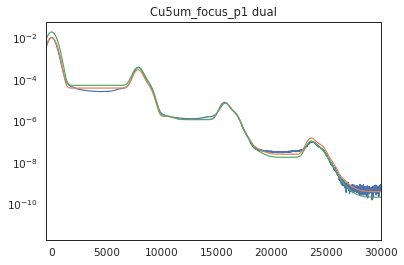

Cu5um_focus_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 9
    chi-square         = 3.92644106
    reduced chi-square = 0.00110916
    Akaike info crit   = -24138.9347
    Bayesian info crit = -24083.3649
##  Warning: uncertainties could not be estimated:
[[Variables]]
    Esignal:          7781.46337 (init = 8046)
    Escatter:         11247.5287 (init = 10989.5)
    Escatter2:        804600 (fixed)
    Ebeta:            8822.30729 (init = 8850.6)
    psignal:          0.32215249 (init = 0.3740015)
    pscatter:         0.00729889 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.28547861 (init = 0.15)
    sigma:            604.034087 (init = 600)
    M:                50 (fixed)
    scale:            9.87442116 (init = 8.705129)
    p:                0.48206954 (init = 0.4)
    scattersigmamod:  0.8 (fixed)
[[Model]]
    Model(_logcom

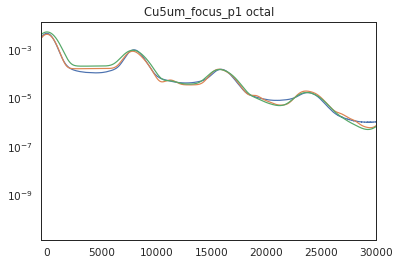

Fe10um_defocus-400_p1 dual
Fe500nm_defocus+400_p1 octal
Fe500nm_defocus+400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 138
    # data points      = 3549
    # variables        = 9
    chi-square         = 10.1438265
    reduced chi-square = 0.00286549
    Akaike info crit   = -20770.4658
    Bayesian info crit = -20714.8960
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6287.23861 (init = 6405)
    Escatter:         10441.5168 (init = 10991.07)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00356496 (init = 0.003431662)
    pscatter:         1.2809e-05 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.24435045 (init = 0.15)
    sigma:            388.764002 (init = 200)
    M:                50 (fixed)
    scale:         

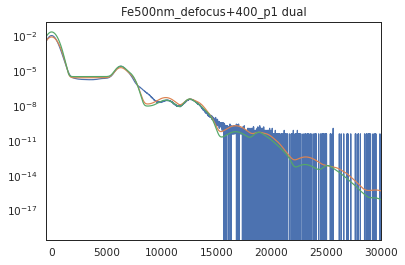

Fe500nm_defocus+400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 150
    # data points      = 3549
    # variables        = 9
    chi-square         = 9.14651641
    reduced chi-square = 0.00258376
    Akaike info crit   = -21137.7596
    Bayesian info crit = -21082.1898
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6298.23033 (init = 6405)
    Escatter:         10838.3344 (init = 10991.07)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.03148477 (init = 0.0403078)
    pscatter:         0.00885458 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.15914268 (init = 0.15)
    sigma:            609.198426 (init = 600)
    M:                50 (fixed)
    scale:            8.69726084 (init = 8.106438)
    p:                0.45112481 (init = 0.4)
    scattersi

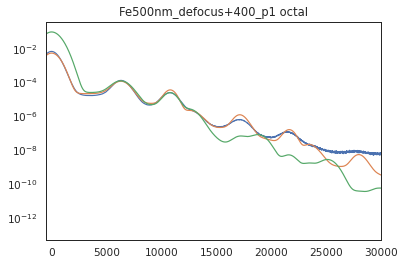

Cu5um_defocus-500_p1 octal
Cu5um_defocus-500_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 104
    # data points      = 3549
    # variables        = 9
    chi-square         = 6.16588615
    reduced chi-square = 0.00174178
    Akaike info crit   = -22537.2766
    Bayesian info crit = -22481.7068
[[Variables]]
    Esignal:          7887.15681 +/- 2.73647165 (0.03%) (init = 8046)
    Escatter:         10438.7053 +/- 45.4226363 (0.44%) (init = 10988.11)
    Escatter2:        804600 (fixed)
    Ebeta:            8776.75276 +/- 7.87137177 (0.09%) (init = 8850.6)
    psignal:          0.05315666 +/- 3.1232e-04 (0.59%) (init = 0.05649675)
    pscatter:         1.3789e-04 +/- 7.8710e-06 (5.71%) (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.15086967 +/- 0.00401091 (2.66%) (init = 0.15)
    sigma:            376.405313 +/- 1.22829691 (0.33%) (init = 200)
    M:                50 (fixed)
    scale:    

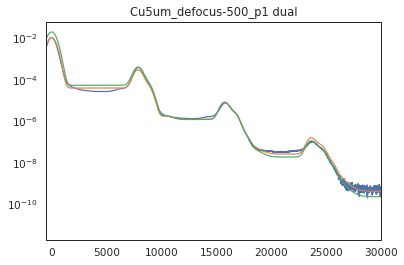

Cu5um_defocus-500_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 9
    chi-square         = 3.83942950
    reduced chi-square = 0.00108458
    Akaike info crit   = -24218.4666
    Bayesian info crit = -24162.8968
##  Warning: uncertainties could not be estimated:
[[Variables]]
    Esignal:          7759.15752 (init = 8046)
    Escatter:         11152.8850 (init = 10988.11)
    Escatter2:        804600 (fixed)
    Ebeta:            8785.25168 (init = 8850.6)
    psignal:          0.33091056 (init = 0.3873927)
    pscatter:         0.00790614 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.29995040 (init = 0.15)
    sigma:            593.600780 (init = 600)
    M:                50 (fixed)
    scale:            9.73825216 (init = 8.634072)
    p:                0.48542334 (init = 0.4)
    scattersigmamod:  0.8 (fixed)
[[Model]]
    Model(

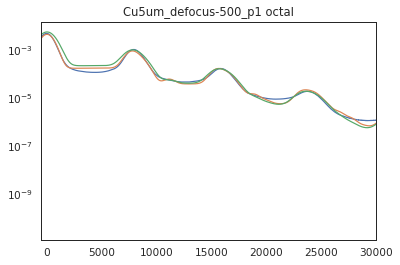

Cu5um_defocus-250_p1 octal
Cu5um_defocus-250_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 106
    # data points      = 3549
    # variables        = 9
    chi-square         = 6.23873255
    reduced chi-square = 0.00176235
    Akaike info crit   = -22495.5929
    Bayesian info crit = -22440.0232
[[Variables]]
    Esignal:          7886.91333 +/- 2.75787394 (0.03%) (init = 8046)
    Escatter:         10438.7197 +/- 3.16099259 (0.03%) (init = 10988.13)
    Escatter2:        804600 (fixed)
    Ebeta:            8777.42734 +/- 7.89530297 (0.09%) (init = 8850.6)
    psignal:          0.05262112 +/- 3.1053e-04 (0.59%) (init = 0.05592826)
    pscatter:         1.3408e-04 +/- 7.7942e-06 (5.81%) (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.15172502 +/- 0.00403971 (2.66%) (init = 0.15)
    sigma:            377.012417 +/- 1.23456317 (0.33%) (init = 200)
    M:                50 (fixed)
    scale:    

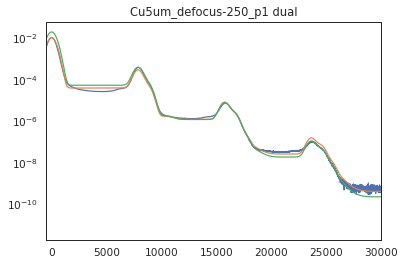

Cu5um_defocus-250_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 9
    chi-square         = 3.78299939
    reduced chi-square = 0.00106864
    Akaike info crit   = -24271.0152
    Bayesian info crit = -24215.4454
##  Warning: uncertainties could not be estimated:
[[Variables]]
    Esignal:          7751.12049 (init = 8046)
    Escatter:         11120.3213 (init = 10988.13)
    Escatter2:        804600 (fixed)
    Ebeta:            8777.74553 (init = 8850.6)
    psignal:          0.33210430 (init = 0.3881772)
    pscatter:         0.00790898 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.29999078 (init = 0.15)
    sigma:            588.349797 (init = 600)
    M:                50 (fixed)
    scale:            9.65662045 (init = 8.581062)
    p:                0.48642411 (init = 0.4)
    scattersigmamod:  0.8 (fixed)
[[Model]]
    Model(

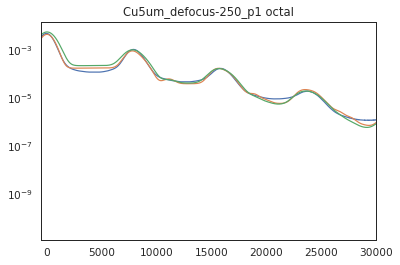

Fe10um_focus_p1 octal
Fe10um_focus_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 121
    # data points      = 3549
    # variables        = 9
    chi-square         = 2.72065245
    reduced chi-square = 7.6855e-04
    Akaike info crit   = -25440.9269
    Bayesian info crit = -25385.3571
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6303.09719 (init = 6405)
    Escatter:         10970.3909 (init = 10989.23)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02719211 (init = 0.02977349)
    pscatter:         3.6904e-05 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.13850568 (init = 0.15)
    sigma:            370.640196 (init = 200)
    M:                50 (fixed)
    scale:            10.6335393 (init = 9.256869)
    p:                0.41825392 (init = 0.4

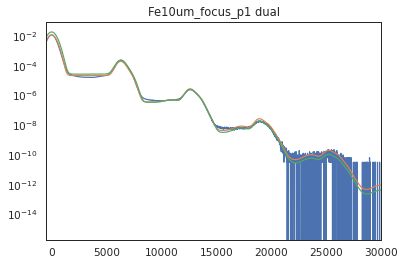

Fe10um_focus_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 9
    chi-square         = 2.29797458
    reduced chi-square = 6.4915e-04
    Akaike info crit   = -26040.1529
    Bayesian info crit = -25984.5831
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6183.20753 (init = 6405)
    Escatter:         10439.7741 (init = 10989.23)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.20123114 (init = 0.253425)
    pscatter:         0.00407284 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.29992555 (init = 0.15)
    sigma:            600.197098 (init = 600)
    M:                50 (fixed)
    scale:            9.99144909 (init = 8.568693)
    p:                0.37843676 

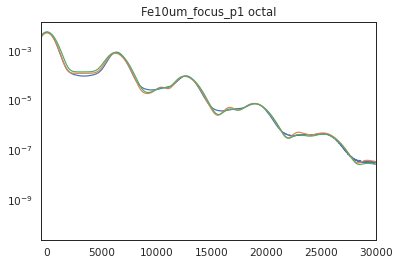

Fe500nm_focus_p1 octal
Fe500nm_focus_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 118
    # data points      = 3549
    # variables        = 9
    chi-square         = 8.39544718
    reduced chi-square = 0.00237160
    Akaike info crit   = -21441.8504
    Bayesian info crit = -21386.2806
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6281.98021 (init = 6405)
    Escatter:         10439.5036 (init = 10988.95)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00447017 (init = 0.004129557)
    pscatter:         8.4335e-06 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.21891244 (init = 0.15)
    sigma:            389.372371 (init = 200)
    M:                50 (fixed)
    scale:            8.82235971 (init = 9.246196)
    p: 

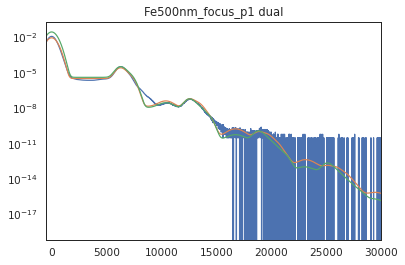

Fe500nm_focus_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 91
    # data points      = 3549
    # variables        = 9
    chi-square         = 10.2596826
    reduced chi-square = 0.00289822
    Akaike info crit   = -20730.1611
    Bayesian info crit = -20674.5914
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6338.49618 (init = 6405)
    Escatter:         10869.9970 (init = 10988.95)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02996830 (init = 0.03736148)
    pscatter:         0.00714326 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.17294991 (init = 0.15)
    sigma:            621.435706 (init = 600)
    M:                50 (fixed)
    scale:            9.02063893 (init = 8.318966)
    p:                0.43526973 (init = 0.4)
    scattersigmamod

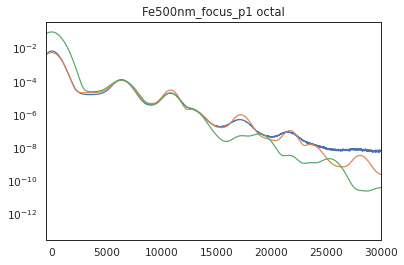

Fe500nm_defocus-200_p1 octal
Fe500nm_defocus-200_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 125
    # data points      = 3549
    # variables        = 9
    chi-square         = 8.46948592
    reduced chi-square = 0.00239251
    Akaike info crit   = -21410.6893
    Bayesian info crit = -21355.1195
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6282.84788 (init = 6405)
    Escatter:         10440.6392 (init = 10990.15)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00418393 (init = 0.003819655)
    pscatter:         8.1943e-06 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.22132732 (init = 0.15)
    sigma:            390.522778 (init = 200)
    M:                50 (fixed)
    scale:            8.75975621 (init = 9.242

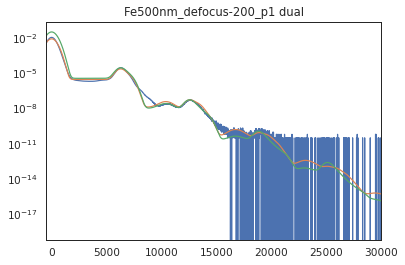

Fe500nm_defocus-200_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 91
    # data points      = 3549
    # variables        = 9
    chi-square         = 9.44562581
    reduced chi-square = 0.00266826
    Akaike info crit   = -21023.5575
    Bayesian info crit = -20967.9877
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6330.35112 (init = 6405)
    Escatter:         10865.3349 (init = 10990.15)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02943736 (init = 0.03643387)
    pscatter:         0.00687526 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.17338590 (init = 0.15)
    sigma:            614.415861 (init = 600)
    M:                50 (fixed)
    scale:            8.98783136 (init = 8.28613)
    p:                0.43303430 (init = 0.4)
    scattersig

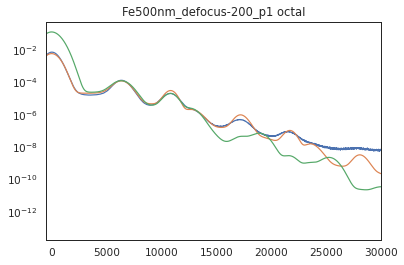

Fe500nm_focus_high_p1 dual
Cu5um_focus_filter_p1 dual
Fe500nm_focus_2_p1 dual
Fe10um_defocus-400_p1 octal
Fe10um_defocus-400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 131
    # data points      = 3549
    # variables        = 9
    chi-square         = 2.68184299
    reduced chi-square = 7.5758e-04
    Akaike info crit   = -25491.9171
    Bayesian info crit = -25436.3473
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6303.85769 (init = 6405)
    Escatter:         10976.5162 (init = 10990.74)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02546759 (init = 0.02777169)
    pscatter:         3.2485e-05 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.13901474 (init = 0.15)
    sigma:            370.614836 (init = 200)
    M:                50 (fixed)
    s

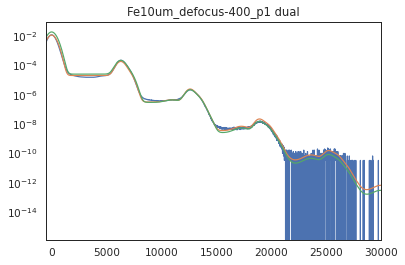

Fe10um_defocus-400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 9
    chi-square         = 2.28605074
    reduced chi-square = 6.4578e-04
    Akaike info crit   = -26058.6160
    Bayesian info crit = -26003.0463
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6173.13484 (init = 6405)
    Escatter:         10441.2415 (init = 10990.74)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.19701684 (init = 0.2475581)
    pscatter:         0.00390054 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.29996573 (init = 0.15)
    sigma:            593.491426 (init = 600)
    M:                50 (fixed)
    scale:            9.89866141 (init = 8.50256)
    p:                0.381

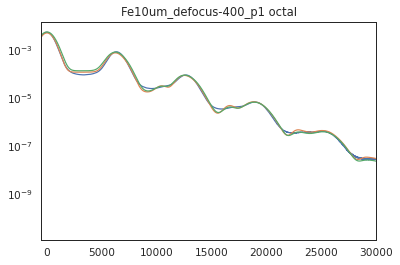

Cu20um_focus_p1 dual
Fe500nm_focus_high_p1 octal
Fe500nm_focus_high_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 106
    # data points      = 3549
    # variables        = 9
    chi-square         = 8.71775839
    reduced chi-square = 0.00246264
    Akaike info crit   = -21308.1504
    Bayesian info crit = -21252.5806
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6282.57802 (init = 6405)
    Escatter:         10438.4655 (init = 10987.86)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01072991 (init = 0.009442835)
    pscatter:         2.9271e-05 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.25002440 (init = 0.15)
    sigma:            387.605595 (init = 200)
    M:                50 (fixed)
    scale:            8.464

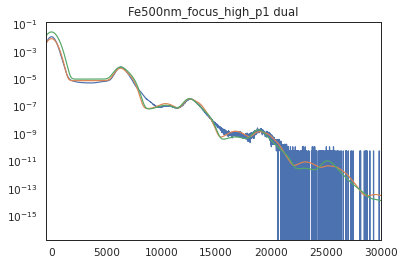

Fe500nm_focus_high_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 153
    # data points      = 3549
    # variables        = 9
    chi-square         = 4.86414856
    reduced chi-square = 0.00137405
    Akaike info crit   = -23378.8871
    Bayesian info crit = -23323.3173
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6174.45535 (init = 6405)
    Escatter:         10738.7706 (init = 10987.86)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.10299139 (init = 0.1251464)
    pscatter:         0.01939860 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.26962125 (init = 0.15)
    sigma:            563.335051 (init = 600)
    M:                50 (fixed)
    scale:            8.10090472 (init = 7.799581)
    p:                0.45119447 (init = 0.4)
    scattersig

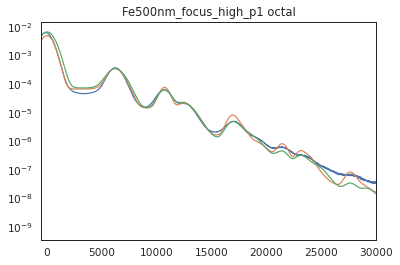

Cu5um_focus_filter_p1 octal
Cu5um_focus_filter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 124
    # data points      = 3549
    # variables        = 9
    chi-square         = 3.11319325
    reduced chi-square = 8.7943e-04
    Akaike info crit   = -24962.6025
    Bayesian info crit = -24907.0327
[[Variables]]
    Esignal:          7896.14768 +/- 1.57160506 (0.02%) (init = 8046)
    Escatter:         10438.4607 +/- 624.347994 (5.98%) (init = 10987.85)
    Escatter2:        804600 (fixed)
    Ebeta:            8976.20086 +/- 31.9473757 (0.36%) (init = 8850.6)
    psignal:          0.01602309 +/- 8.0135e-05 (0.50%) (init = 0.0133983)
    pscatter:         7.8726e-06 +/- 4.6405e-07 (5.89%) (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.00286638 +/- 2.8230e-04 (9.85%) (init = 0.15)
    sigma:            370.226121 +/- 0.68910793 (0.19%) (init = 200)
    M:                50 (fixed)
    scale:   

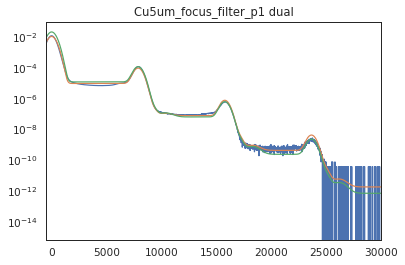

Cu5um_focus_filter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 9
    chi-square         = 4.95164813
    reduced chi-square = 0.00139877
    Akaike info crit   = -23315.6127
    Bayesian info crit = -23260.0429
##  Warning: uncertainties could not be estimated:
    Esignal:          at boundary
[[Variables]]
    Esignal:          7724.16047 (init = 8046)
    Escatter:         10938.7814 (init = 10987.85)
    Escatter2:        804600 (fixed)
    Ebeta:            8463.61173 (init = 8850.6)
    psignal:          0.13292202 (init = 0.1415742)
    pscatter:         6.9756e-04 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.20493932 (init = 0.15)
    sigma:            565.412129 (init = 600)
    M:                50 (fixed)
    scale:            9.32295083 (init = 7.968422)
    p:                0.50644359 (init = 0.4)
    scattersigmamod

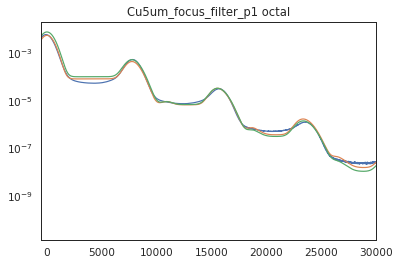

Cu20um_focus_p1 octal
Cu20um_focus_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 105
    # data points      = 3549
    # variables        = 9
    chi-square         = 5.84551136
    reduced chi-square = 0.00165127
    Akaike info crit   = -22726.6434
    Bayesian info crit = -22671.0736
[[Variables]]
    Esignal:          7888.35532 +/- 2.76581857 (0.04%) (init = 8046)
    Escatter:         10439.9925 +/- 44.9002651 (0.43%) (init = 10989.47)
    Escatter2:        804600 (fixed)
    Ebeta:            8776.02393 +/- 7.25413574 (0.08%) (init = 8850.6)
    psignal:          0.04733741 +/- 2.8223e-04 (0.60%) (init = 0.05073074)
    pscatter:         1.1542e-04 +/- 6.5369e-06 (5.66%) (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.16554274 +/- 0.00416028 (2.51%) (init = 0.15)
    sigma:            374.040598 +/- 1.16759357 (0.31%) (init = 200)
    M:                50 (fixed)
    scale:            10

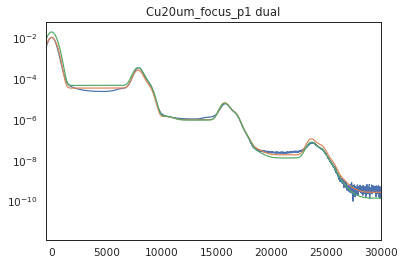

Cu20um_focus_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 9
    chi-square         = 4.49470733
    reduced chi-square = 0.00126969
    Akaike info crit   = -23659.2266
    Bayesian info crit = -23603.6568
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
[[Variables]]
    Esignal:          7856.69441 (init = 8046)
    Escatter:         11538.9361 (init = 10989.47)
    Escatter2:        804600 (fixed)
    Ebeta:            8944.81593 (init = 8850.6)
    psignal:          0.28188681 (init = 0.3194968)
    pscatter:         0.00518048 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.23779517 (init = 0.15)
    sigma:            639.419866 (init = 600)
    M:                50 (fixed)
    scale:            10.3271709 (init = 8.905556)
    p:                0.47152806 (init = 0.4)
    scattersigmamod:  0.8

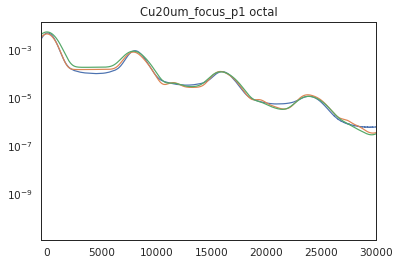

Fe500nm_focus_2_p1 octal
Fe500nm_focus_2_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 129
    # data points      = 3549
    # variables        = 9
    chi-square         = 7.79553883
    reduced chi-square = 0.00220213
    Akaike info crit   = -21704.9660
    Bayesian info crit = -21649.3962
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6286.66715 (init = 6405)
    Escatter:         10440.2310 (init = 10989.72)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00369742 (init = 0.00350685)
    pscatter:         1.3855e-05 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.23160476 (init = 0.15)
    sigma:            387.678932 (init = 200)
    M:                50 (fixed)
    scale:            8.90555194 (init = 9.241797)
    

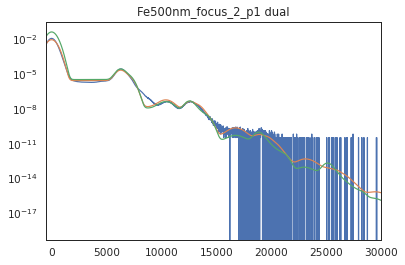

Fe500nm_focus_2_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 111
    # data points      = 3549
    # variables        = 9
    chi-square         = 6.63476826
    reduced chi-square = 0.00187423
    Akaike info crit   = -22277.1637
    Bayesian info crit = -22221.5939
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6298.23787 (init = 6405)
    Escatter:         10851.3675 (init = 10989.72)
    Escatter2:        640500 (fixed)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.03169877 (init = 0.04210476)
    pscatter:         0.00953539 (init = 0.0001)
    pscatter2:        0 (fixed)
    pbeta:            0.15347378 (init = 0.15)
    sigma:            604.566324 (init = 600)
    M:                50 (fixed)
    scale:            8.85286909 (init = 8.100884)
    p:                0.44992548 (init = 0.4)
    scattersigma

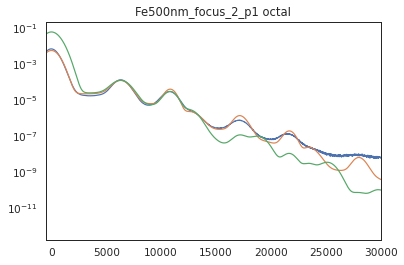

In [332]:

dettiles=[('dual', ['tile0', 'tile1']), ('octal', ['tile3', 'tile4'])]

def escatterfunc(fn,e):
    return np.mean(e) #if '500nm' in str(fn) else None

func=functools.partial(fitfile,dettiles=dettiles,Escatter2=None,Escatterfunc=escatterfunc, lim=35000)
fns=list(Path('/arcv1/UserData/gorkhover/TAIS2020/foils/p1/final/').glob('*.h5'))
from multiprocessing import Pool
resfoil={}
with Pool(8) as pool:
    for c in pool.imap_unordered(func,fns):
        resfoil.update(c)
        for fn,v in c.items():
            for det,r in v.items():
                f1,f2,x,hist=r

                x1 = x[(x > -500) & (x < 35000)]
                h1=hist[(x > -500) & (x < 35000)]
                print(fn,det)
                print(f1.fit_report())
                print(f2.fit_report())
                plt.semilogy(x, hist)
                plt.semilogy(x1, 10 ** f1.best_fit)
                plt.semilogy(x1, 10 ** f2.best_fit)
                plt.xlim(-500, 30000)
                plt.title(f'{fn} {det}')
                plt.show()
            



In [340]:
np.sum(10**f1.best_fit)

0.9728222419522213

In [333]:
import pickle
pickle.dump(resfoil,open( "foilspectrumfit.pkl", "wb" ) )

In [296]:
from collections import defaultdict
tmp=defaultdict(list)
ps=[]
for fn in sorted(list(resfoil.keys())):
    (f1, f2, x, hist) = resfoil[fn]['dual']
    #print(fn,f1.params['p'].value)
    tmp[fn.split('_')[0]].append(f1.params['psignal'].value)
#     p1=np.sum(hist[(x+1000>f1.params['Esignal'].value) &( x-500<f1.params['Esignal'].value)])
#     p2=np.sum(hist[(x+1000>2*f1.params['Esignal'].value) &( x-500<2*f1.params['Esignal'].value)])
#     p1/=(p1+2*p2)/f2.params['psignal'].value
#     p2/=(p1+2*p2)/f2.params['psignal'].value
    ps.append(f1.params['p'].value)
    #print(fn,f2.params['M'].value,p1**2/((2*p2*(1-p1))-p1**2))
print('p',np.mean(ps),np.std(ps)/np.sqrt(len(ps)))

for k,v in tmp.items():
    print(k,f'{np.mean(v)}\pm{np.std(v)/np.sqrt(len(v))}')

p 0.43233115286574986 0.015027162965857236
Cu20um 0.04468638190898411\pm0.0004111308600745073
Cu5um 0.04162684138886613\pm0.00770157295564988
Fe10um 0.02432174244631069\pm0.0005802332353784253
Fe500nm 0.005966959691950713\pm0.0014108991427105497


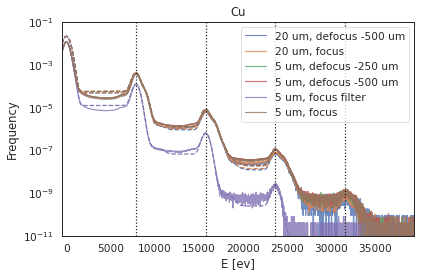

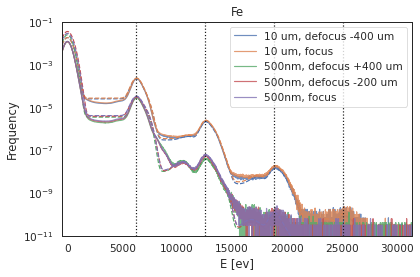

In [344]:
from collections import defaultdict
import seaborn as sns
sns.set_theme('paper','white',font_scale=1.2)
tmp=defaultdict(list)
for fn in sorted(list(resfoil.keys())):
    (f1, f2, x, hist) = resfoil[fn]['dual']
    material,thickness,name=re.match(r'([a-zA-Z]*)([0-9]*.m)_(.*)_p1',fn).groups()
    r=(thickness,name,fn,f1, f2, x, hist)
    tmp[material].append(r)
skip=['focus_2','focus_high']
for material,rs in tmp.items():
    for (thickness,name,fn,f1, f2, x, hist) in rs:
        
        if any([(k in name or k in thickness) for k in skip]): continue
        label=f'{thickness.replace("um"," um")}, {name.replace("focus","focus ").replace("_","").replace("00","00 um").replace("250","250 um")}'
        p1=plt.semilogy(x,hist,label=label,alpha=0.8)[0]
        x1 = x[(x > -500) & (x < 35000)]
        fit=f2.best_fit# if f2.params['pscatter'].value==0 else f1.best_fit    
        plt.semilogy(x1,10**fit,c=p1.get_color(),linestyle='--')
    
    plt.legend()
    for i in range(1,5):
        e=i*f2.params['Esignal'].value
        plt.axvline(e,c='k',linestyle=':')
    plt.xlim(-500,5*f2.params['Esignal'].value)
    plt.ylim(1e-11,1e-1)
    plt.xlabel('E [ev]')
    plt.ylabel('Frequency')
    plt.title(material)
    plt.tight_layout()
    plt.savefig(f"{material}.pdf")
    plt.show()

In [345]:
import itertools
import pandas as pd
keys=['Esignal',
 'Escatter',
 'Ebeta',
 'psignal',
 'pscatter',
 'pbeta',
 'sigma',
 'M',
 'scale',
 'p',
 'scattersigmamod']

tmp = [['_'.join(fn.split('_')[:-1]), *[v[d][1].params[p].value for d, p in itertools.product(['dual', 'octal'],keys)]] for fn, v in resfoil.items()]
df=pd.DataFrame(tmp,columns=['Name']+[f"{d}_{p}" for d, p in itertools.product(['dual','octal'],keys)])
#l=log('sacla2020.csv')
#l.dataframe.columns=l.dataframe.columns.droplevel(1)
#dfj=l.dataframe[25:99].set_index('Name').join(df.set_index('Name'))
df.to_csv('foilspectrumfit.csv')

## Nano

<ipython-input-39-98921a186ae0>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-39-98921a186ae0>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-39-98921a186ae0>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-39-98921a186ae0>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]
<ipython-input-39-98921a186ae0>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]


FeCl3PS_focus_p1 dual
20nmPS_+400_p1 dual
20nmSpin_p1 dual
copolymeronly_p1 dual
benNi40nm_p1 dual
20nmPS_-400_p1 dual
benNi20nm_p1 dual
FeCl3PS_focus_p1 octal
FeCl3PS_focus_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 115
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.76024257
    reduced chi-square = 4.9752e-04
    Akaike info crit   = -26982.2329
    Bayesian info crit = -26914.3142
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6345.99836 (init = 6405)
    Escatter:         10440.6447 (init = 10990.15)
    Escatter2:        8479.75216 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00180530 (init = 0.001667115)
    pscatter:         2.2295e-05 (init = 0.0001)
    pscatter2:        1.1349e-04 (init = 0.0001)
    pbeta:         

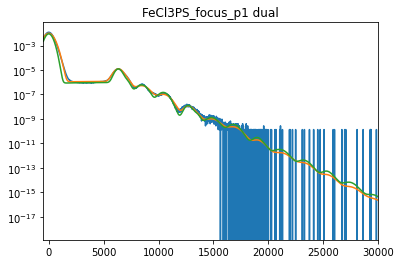

FeCl3PS_focus_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 3.54326743
    reduced chi-square = 0.00100149
    Akaike info crit   = -24499.3607
    Bayesian info crit = -24431.4421
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6333.50916 (init = 6405)
    Escatter:         10914.2358 (init = 10990.15)
    Escatter2:        8168.24213 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02179364 (init = 0.03276146)
    pscatter:         0.00416728 (init = 0.0001)
    pscatter2:        0.00132786 (init = 0.0001)
    pbeta:            0.29999840 (init = 0.15)
    sigma:            627.925743 (init = 600)
    M:                50 (fixed)
    scale:            9.60383036 (init = 8.316914)
  

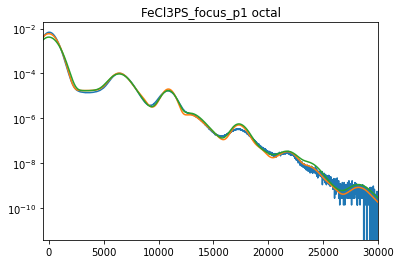

10nmCo_+400_p1 dual
20nmSpin_p1 octal
20nmSpin_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 97
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.85282564
    reduced chi-square = 8.0634e-04
    Akaike info crit   = -25268.5686
    Bayesian info crit = -25200.6500
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6333.53754 (init = 6405)
    Escatter:         10496.1170 (init = 10987.73)
    Escatter2:        7903.44403 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          9.5393e-04 (init = 0.001397495)
    pscatter:         3.0805e-04 (init = 0.0001)
    pscatter2:        3.6858e-05 (init = 0.0001)
    pbeta:            0.20160163 (init = 0.15)
    sigma:            366.945153 (init = 200)
    M:                50 (fixed)
    scale:            9.63541177 (init = 9.273772)
    

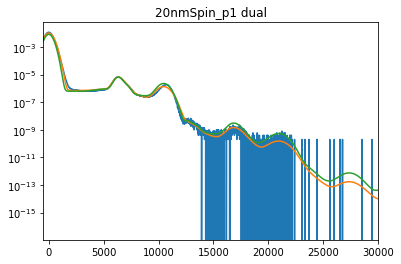

20nmSpin_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 9.57646973
    reduced chi-square = 0.00270675
    Akaike info crit   = -20970.7330
    Bayesian info crit = -20902.8143
##  Warning: uncertainties could not be estimated:
    Escatter2:        at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6541.83357 (init = 6405)
    Escatter:         10890.3172 (init = 10987.73)
    Escatter2:        7790.06718 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00638256 (init = 0.04697328)
    pscatter:         0.02476999 (init = 0.0001)
    pscatter2:        0.00454696 (init = 0.0001)
    pbeta:            0.29994823 (init = 0.15)
    sigma:            650.715128 (init = 600)
    M:                50 (fixed)
    scale:            9.53899297 (init = 8.08988)
    p:  

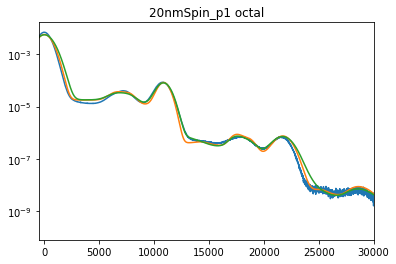

copolymeronly_p1 octal
copolymeronly_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 3.45955778
    reduced chi-square = 9.7783e-04
    Akaike info crit   = -24584.2121
    Bayesian info crit = -24516.2934
##  Warning: uncertainties could not be estimated:
    Esignal:          at boundary
    Escatter:         at boundary
    Escatter2:        at boundary
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6661.19899 (init = 6405)
    Escatter:         10440.1187 (init = 10989.59)
    Escatter2:        7790.03537 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          3.4878e-05 (init = 1e-05)
    pscatter:         1.5906e-04 (init = 0.01)
    pscatter2:        1.2558e-04 (init = 0.0001)
    pbeta:            0.29999999 (init = 0.15)
    sigma:     

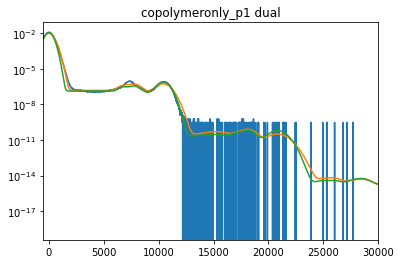

copolymeronly_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 3.78415323
    reduced chi-square = 0.00106957
    Akaike info crit   = -24265.9329
    Bayesian info crit = -24198.0142
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6412.80063 (init = 6405)
    Escatter:         10919.7564 (init = 10989.59)
    Escatter2:        7790.08769 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01387459 (init = 1e-05)
    pscatter:         0.00891150 (init = 0.01)
    pscatter2:        0.00690977 (init = 0.0001)
    pbeta:            0.29999138 (init = 0.15)
    sigma:            634.288737 (init = 600)
    M:                50 (fixed)
    scale:            9.98179579 (init = 8.269788)
    p:                0.47205644 (init = 0.

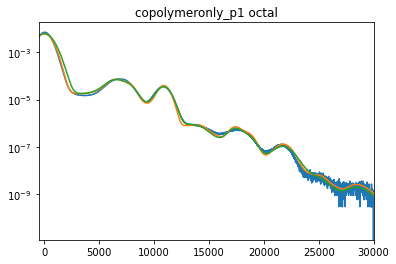

<ipython-input-39-98921a186ae0>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]


20nmPS_+400_p1 octal
20nmPS_+400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 112
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.10876711
    reduced chi-square = 5.9603e-04
    Akaike info crit   = -26341.0995
    Bayesian info crit = -26273.1808
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6321.53087 (init = 6405)
    Escatter:         10440.4629 (init = 10989.96)
    Escatter2:        8507.50848 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00980125 (init = 0.01163016)
    pscatter:         1.5095e-04 (init = 0.0001)
    pscatter2:        8.5509e-04 (init = 0.0001)
    pbeta:            0.13188895 (init = 0.15)
    sigma:            363.141738 (init = 200)
    M:                50 (fixed)
    scale:            10.4847141 (i

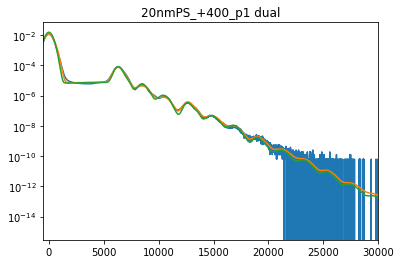

20nmPS_+400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.04409025
    reduced chi-square = 0.00114304
    Akaike info crit   = -24030.1569
    Bayesian info crit = -23962.2383
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6282.90608 (init = 6405)
    Escatter:         10845.8886 (init = 10989.96)
    Escatter2:        8136.68086 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02808519 (init = 0.05093801)
    pscatter:         0.00933815 (init = 0.0001)
    pscatter2:        0.00199644 (init = 0.0001)
    pbeta:            0.29998946 (init = 0.15)
    sigma:            622.404774 (init = 600)
    M:                50 (fixed)
    scale:            9.65938500 (init = 8.212247)
    p:                0.41872006 (init

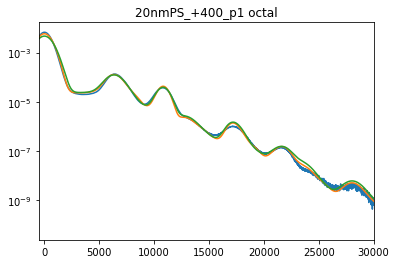

benNi20nm_p1 octal
benNi20nm_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.94174398
    reduced chi-square = 8.3147e-04
    Akaike info crit   = -25159.6405
    Bayesian info crit = -25091.7218
##  Warning: uncertainties could not be estimated:
[[Variables]]
    Esignal:          7338.54739 (init = 7480)
    Escatter:         10512.9430 (init = 10988.65)
    Escatter2:        7792.85343 (init = 8200)
    Ebeta:            8108.20447 (init = 8228)
    psignal:          0.00225709 (init = 0.002155273)
    pscatter:         6.7008e-05 (init = 0.0001)
    pscatter2:        3.3144e-04 (init = 0.0001)
    pbeta:            0.14724158 (init = 0.15)
    sigma:            370.367033 (init = 200)
    M:                50 (fixed)
    scale:            9.19452617 (init = 9.278288)
    p:                0.40767167 (init = 0.4)
    scattersigma

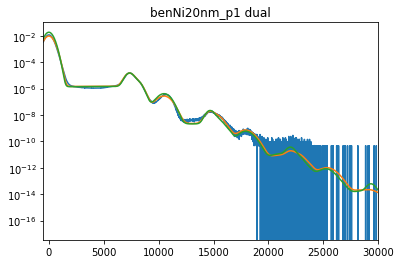

benNi20nm_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 141
    # data points      = 3549
    # variables        = 11
    chi-square         = 5.99031122
    reduced chi-square = 0.00169313
    Akaike info crit   = -22635.8019
    Bayesian info crit = -22567.8832
[[Variables]]
    Esignal:          7180.80000 +/- 6.07215504 (0.08%) (init = 7480)
    Escatter:         10965.3834 +/- 3.99050532 (0.04%) (init = 10988.65)
    Escatter2:        7790.00001 +/- 34.7930982 (0.45%) (init = 8200)
    Ebeta:            8601.99998 +/- 108.601586 (1.26%) (init = 8228)
    psignal:          0.00715740 +/- 4.2298e-04 (5.91%) (init = 0.01431063)
    pscatter:         0.00412522 +/- 3.8259e-05 (0.93%) (init = 0.0001)
    pscatter2:        0.00276022 +/- 3.8594e-04 (13.98%) (init = 0.0001)
    pbeta:            0.15468392 +/- 0.02427336 (15.69%) (init = 0.15)
    sigma:            637.128271 +/- 1.50635834 (0.24%) (init = 600)
    M: 

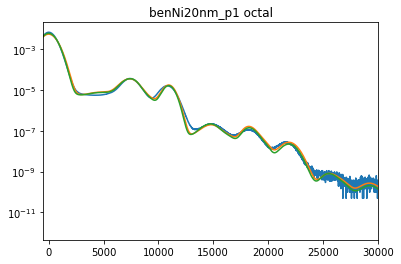

benNi40nm_p1 octal
benNi40nm_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 139
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.51604717
    reduced chi-square = 7.1115e-04
    Akaike info crit   = -25714.3971
    Bayesian info crit = -25646.4785
[[Variables]]
    Esignal:          7327.54719 +/- 4.22695302 (0.06%) (init = 7480)
    Escatter:         10555.6067 +/- 6.29977925 (0.06%) (init = 10989.68)
    Escatter2:        7790.00009 +/- 436.325427 (5.60%) (init = 8200)
    Ebeta:            8091.55770 +/- 19.9685672 (0.25%) (init = 8228)
    psignal:          0.00406726 +/- 1.1761e-04 (2.89%) (init = 0.004475764)
    pscatter:         6.8115e-05 +/- 8.8549e-07 (1.30%) (init = 0.0001)
    pscatter2:        6.5791e-04 +/- 1.7717e-04 (26.93%) (init = 0.0001)
    pbeta:            0.13891006 +/- 0.01393778 (10.03%) (init = 0.15)
    sigma:            366.534528 +/- 0.57896328 (0.16%) (

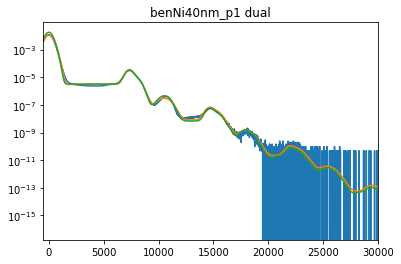

benNi40nm_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.32222977
    reduced chi-square = 0.00122166
    Akaike info crit   = -23794.0959
    Bayesian info crit = -23726.1773
##  Warning: uncertainties could not be estimated:
    Esignal:          at boundary
    Ebeta:            at boundary
[[Variables]]
    Esignal:          7180.80000 (init = 7480)
    Escatter:         10964.9704 (init = 10989.68)
    Escatter2:        7794.95759 (init = 8200)
    Ebeta:            8601.98230 (init = 8228)
    psignal:          0.01135992 (init = 0.02178708)
    pscatter:         0.00373402 (init = 0.0001)
    pscatter2:        0.00513281 (init = 0.0001)
    pbeta:            0.15474095 (init = 0.15)
    sigma:            638.426864 (init = 600)
    M:                50 (fixed)
    scale:            9.85140149 (init = 8.29949)
    p:        

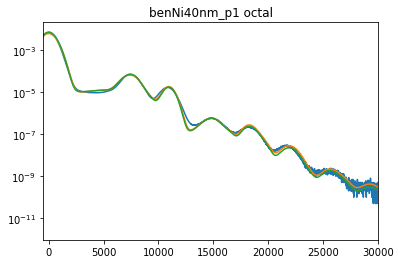

20nmPS_-400_p1 octal
20nmPS_-400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 97
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.09921123
    reduced chi-square = 5.9333e-04
    Akaike info crit   = -26357.2183
    Bayesian info crit = -26289.2997
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6325.27663 (init = 6405)
    Escatter:         10444.5377 (init = 10987.9)
    Escatter2:        8507.22183 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01049700 (init = 0.01140607)
    pscatter:         1.7502e-04 (init = 0.0001)
    pscatter2:        9.0536e-04 (init = 0.0001)
    pbeta:            0.12873081 (init = 0.15)
    sigma:            364.623427 (init = 200)
    M:                50 (fixed)
    scale:            9.91657953 (init = 9.271204)
    p:              

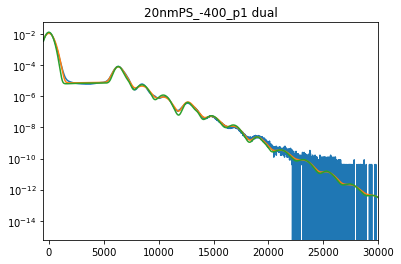

20nmPS_-400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.43765251
    reduced chi-square = 0.00125428
    Akaike info crit   = -23700.5652
    Bayesian info crit = -23632.6466
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6229.76604 (init = 6405)
    Escatter:         10798.6202 (init = 10987.9)
    Escatter2:        8231.41898 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.03179164 (init = 0.05565523)
    pscatter:         0.01051238 (init = 0.0001)
    pscatter2:        0.00165913 (init = 0.0001)
    pbeta:            0.29981387 (init = 0.15)
    sigma:            603.457622 (init = 600)
    M:                50 (fixed)
    scale:            9.12234168 (init = 7.936772)
    p:                0.42429177 (init 

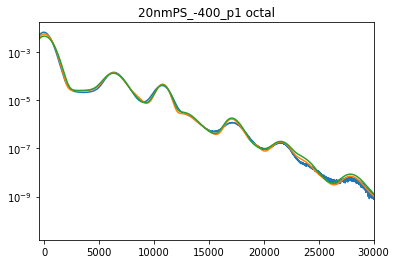

10nmPS_-400_p1 dual
10nmPS_focus_nofilter_p1 dual
10nmPS_-400_att_nofilter_p1 dual
20nmCo_-400_nofilter_p1 dual
10nmCo_+400_p1 octal
10nmCo_+400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 124
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.84724680
    reduced chi-square = 5.2212e-04
    Akaike info crit   = -26811.0124
    Bayesian info crit = -26743.0938
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6321.88688 (init = 6405)
    Escatter:         10440.7718 (init = 10990.29)
    Escatter2:        8370.45535 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00506201 (init = 0.005531413)
    pscatter:         1.0080e-04 (init = 0.0001)
    pscatter2:        3.5715e-05 (init = 0.0001)
    pbeta:            0.13998459 (init = 0.15)
 

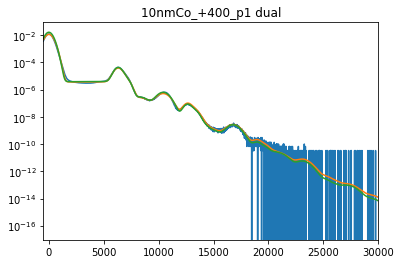

10nmCo_+400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.98061812
    reduced chi-square = 0.00140775
    Akaike info crit   = -23290.9095
    Bayesian info crit = -23222.9909
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6296.07925 (init = 6405)
    Escatter:         10860.8677 (init = 10990.29)
    Escatter2:        7998.33503 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01583589 (init = 0.03414054)
    pscatter:         0.00825854 (init = 0.0001)
    pscatter2:        0.00176675 (init = 0.0001)
    pbeta:            0.29999997 (init = 0.15)
    sigma:            618.678789 (init = 600)
    M:                50 (fixed)
    scale:            9.53100308 (init = 8.076778)
    

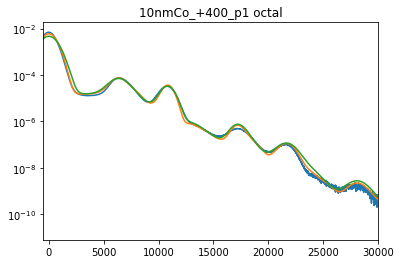

10nmCo_-400_p1 dual
10nmPS_-400_full_nofilter_p1 dual
10nmPS_+400_p1 dual
10nmPS_-400_att_nofilter_p1 octal
10nmPS_-400_att_nofilter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 114
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.62436728
    reduced chi-square = 4.5912e-04
    Akaike info crit   = -27267.3356
    Bayesian info crit = -27199.4169
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6330.91071 (init = 6405)
    Escatter:         10440.8850 (init = 10990.41)
    Escatter2:        8503.82270 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00339085 (init = 0.003354486)
    pscatter:         1.3281e-05 (init = 0.0001)
    pscatter2:        1.1466e-04 (init = 0.0001)
    pbeta:            0.10733397 (init = 0.15)
    sigma:   

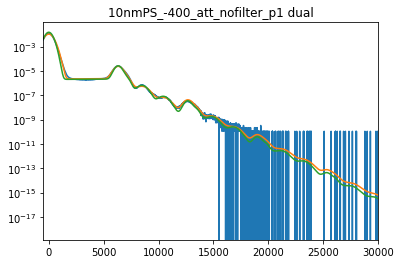

10nmPS_-400_att_nofilter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 6.01074834
    reduced chi-square = 0.00169891
    Akaike info crit   = -22623.7144
    Bayesian info crit = -22555.7957
##  Warning: uncertainties could not be estimated:
    Esignal:          at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6148.80447 (init = 6405)
    Escatter:         10755.0490 (init = 10990.41)
    Escatter2:        8609.73472 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.04164853 (init = 0.07346591)
    pscatter:         0.02000534 (init = 0.0001)
    pscatter2:        8.9491e-04 (init = 0.0001)
    pbeta:            0.16740406 (init = 0.15)
    sigma:            574.709472 (init = 600)
    M:                50 (fixed)
    scale:            8.26257078 (init = 7

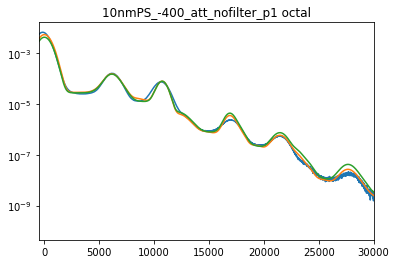

10nmPS_-400_p1 octal
10nmPS_-400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 97
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.60291557
    reduced chi-square = 4.5306e-04
    Akaike info crit   = -27314.5166
    Bayesian info crit = -27246.5979
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6314.32869 (init = 6405)
    Escatter:         10491.2262 (init = 10987.56)
    Escatter2:        8471.92568 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01582508 (init = 0.01785707)
    pscatter:         8.4028e-05 (init = 0.0001)
    pscatter2:        6.5025e-04 (init = 0.0001)
    pbeta:            0.18299412 (init = 0.15)
    sigma:            365.234286 (init = 200)
    M:                50 (fixed)
    scale:            10.2534296 (init = 9.279635)
    p:             

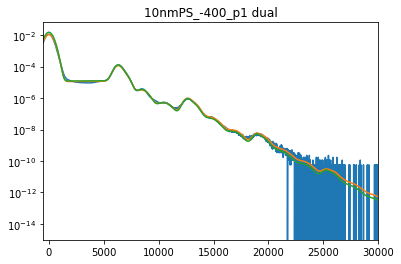

10nmPS_-400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 167
    # data points      = 3549
    # variables        = 11
    chi-square         = 3.19830204
    reduced chi-square = 9.0399e-04
    Akaike info crit   = -24862.8821
    Bayesian info crit = -24794.9635
##  Warning: uncertainties could not be estimated:
    Escatter2:        at boundary
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6252.64101 (init = 6405)
    Escatter:         10787.0310 (init = 10987.56)
    Escatter2:        8610.00000 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.04243728 (init = 0.05935907)
    pscatter:         0.00558213 (init = 0.0001)
    pscatter2:        0.00115393 (init = 0.0001)
    pbeta:            0.30000000 (init = 0.15)
    sigma:            605.884413 (init = 600)
    M:                50 (fixed)
    scale:           

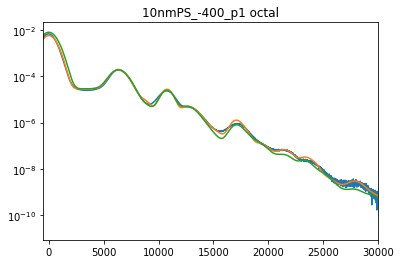

copolymeronly_focus_nofilter_p1 dual
10nmPS_focus_nofilter_p1 octal
10nmPS_focus_nofilter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 114
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.77526723
    reduced chi-square = 5.0177e-04
    Akaike info crit   = -26952.0687
    Bayesian info crit = -26884.1501
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6330.43035 (init = 6405)
    Escatter:         10439.7281 (init = 10989.19)
    Escatter2:        8506.20056 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00327337 (init = 0.003255173)
    pscatter:         1.2873e-05 (init = 0.0001)
    pscatter2:        1.0907e-04 (init = 0.0001)
    pbeta:            0.11988130 (init = 0.15)
    sigma:            367.520239 (init = 200)
    M:    

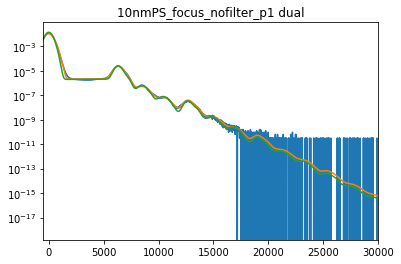

10nmPS_focus_nofilter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 3.20339236
    reduced chi-square = 9.0542e-04
    Akaike info crit   = -24857.2381
    Bayesian info crit = -24789.3195
##  Warning: uncertainties could not be estimated:
    Esignal:          at boundary
    Escatter2:        at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6148.80001 (init = 6405)
    Escatter:         10724.3485 (init = 10989.19)
    Escatter2:        8609.94062 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.18485361 (init = 0.3242702)
    pscatter:         0.08249864 (init = 0.0001)
    pscatter2:        0.00539193 (init = 0.0001)
    pbeta:            0.21064313 (init = 0.15)
    sigma:            568.839197 (init = 600)
    M:                50 (fixed)
    scale:  

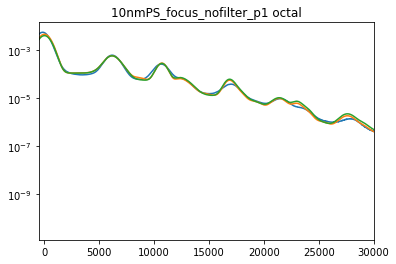

10nmCo_-400_p1 octal
10nmCo_-400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 126
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.66643565
    reduced chi-square = 4.7101e-04
    Akaike info crit   = -27176.5925
    Bayesian info crit = -27108.6739
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6321.90308 (init = 6405)
    Escatter:         10439.4498 (init = 10988.89)
    Escatter2:        8158.40302 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00423206 (init = 0.004672194)
    pscatter:         7.7190e-05 (init = 0.0001)
    pscatter2:        5.1515e-05 (init = 0.0001)
    pbeta:            0.18928467 (init = 0.15)
    sigma:            367.480769 (init = 200)
    M:                50 (fixed)
    scale:            10.1198214 (

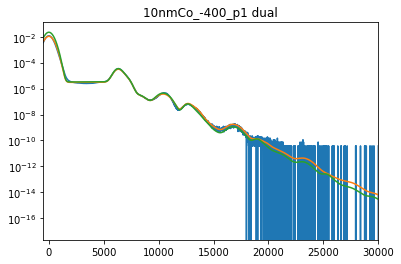

10nmCo_-400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 191
    # data points      = 3549
    # variables        = 11
    chi-square         = 3.75785085
    reduced chi-square = 0.00106214
    Akaike info crit   = -24290.6869
    Bayesian info crit = -24222.7683
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6305.24144 (init = 6405)
    Escatter:         10854.9654 (init = 10988.89)
    Escatter2:        7843.89039 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02238299 (init = 0.04566864)
    pscatter:         0.00677606 (init = 0.0001)
    pscatter2:        0.00577478 (init = 0.0001)
    pbeta:            0.30000000 (init = 0.15)
    sigma:            621.479924 (init = 600)
    M:                50 (fixed)
    scale:            9.85954473 (init = 8.179872)
    

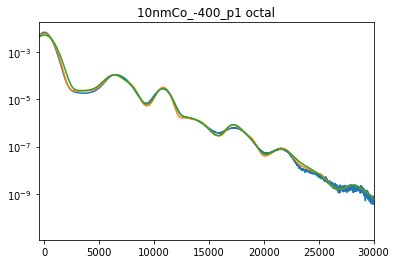

<ipython-input-39-98921a186ae0>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]


20nmCo_-400_nofilter_p1 octal
20nmCo_-400_nofilter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 115
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.93578083
    reduced chi-square = 5.4714e-04
    Akaike info crit   = -26644.8679
    Bayesian info crit = -26576.9493
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6339.54505 (init = 6405)
    Escatter:         10439.6168 (init = 10989.07)
    Escatter2:        8310.31753 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00192237 (init = 0.001962416)
    pscatter:         4.1791e-05 (init = 0.0001)
    pscatter2:        1.7710e-05 (init = 0.0001)
    pbeta:            0.17228960 (init = 0.15)
    sigma:            368.469274 (init = 200)
    M:                50 (fixed)
    scale:      

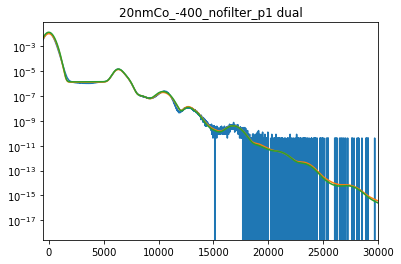

20nmCo_-400_nofilter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.45800133
    reduced chi-square = 0.00126003
    Akaike info crit   = -23684.3285
    Bayesian info crit = -23616.4098
##  Warning: uncertainties could not be estimated:
    Escatter2:        at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6356.12144 (init = 6405)
    Escatter:         10939.8543 (init = 10989.07)
    Escatter2:        8609.99965 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.12015492 (init = 0.7266512)
    pscatter:         0.43422974 (init = 0.0001)
    pscatter2:        0.00688038 (init = 0.0001)
    pbeta:            0.16288016 (init = 0.15)
    sigma:            696.529039 (init = 600)
    M:                50 (fixed)
    scale:            10.2793453 (init = 9.0195

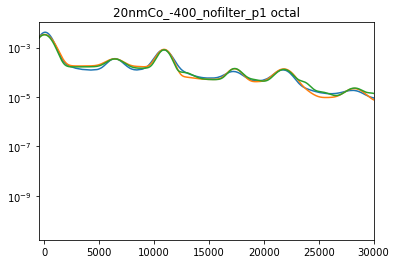

10nmPS_-400_full_nofilter_p1 octal
10nmPS_-400_full_nofilter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 97
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.46914534
    reduced chi-square = 4.1525e-04
    Akaike info crit   = -27623.7884
    Bayesian info crit = -27555.8698
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6318.47983 (init = 6405)
    Escatter:         10509.2489 (init = 10989.12)
    Escatter2:        8486.48262 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01538184 (init = 0.01633142)
    pscatter:         8.2231e-05 (init = 0.0001)
    pscatter2:        5.8601e-04 (init = 0.0001)
    pbeta:            0.17314011 (init = 0.15)
    sigma:            367.380965 (init = 200)
    M:                50 (fixed)
    scale:            9.96432191 (init = 9

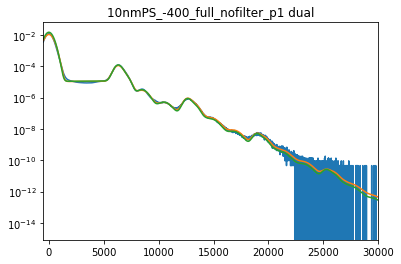

10nmPS_-400_full_nofilter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 3.15420226
    reduced chi-square = 8.9152e-04
    Akaike info crit   = -24912.1580
    Bayesian info crit = -24844.2393
##  Warning: uncertainties could not be estimated:
    Escatter2:        at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6164.40409 (init = 6405)
    Escatter:         10735.4470 (init = 10989.12)
    Escatter2:        8609.96608 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.18133308 (init = 0.3611454)
    pscatter:         0.10538236 (init = 0.0001)
    pscatter2:        0.00668554 (init = 0.0001)
    pbeta:            0.25407203 (init = 0.15)
    sigma:            579.075427 (init = 600)
    M:                50 (fixed)
    scale:            8.73205077 (init = 8

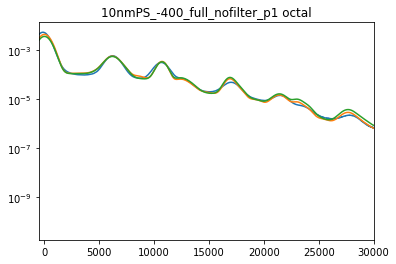

10nmPS_+400_p1 octal
10nmPS_+400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 97
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.17792304
    reduced chi-square = 6.1558e-04
    Akaike info crit   = -26226.5795
    Bayesian info crit = -26158.6609
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6323.28516 (init = 6405)
    Escatter:         10465.6748 (init = 10990.14)
    Escatter2:        8510.64268 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01239910 (init = 0.01522316)
    pscatter:         3.2850e-04 (init = 0.0001)
    pscatter2:        0.00127125 (init = 0.0001)
    pbeta:            0.14477943 (init = 0.15)
    sigma:            360.651917 (init = 200)
    M:                50 (fixed)
    scale:            10.5471314 (init = 9.282985)
    p:             

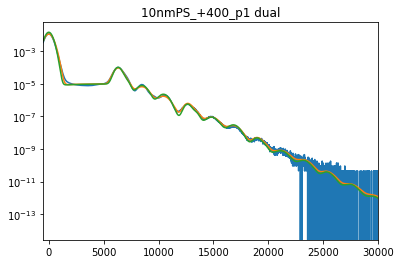

10nmPS_+400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 154
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.06721812
    reduced chi-square = 0.00114958
    Akaike info crit   = -24009.9183
    Bayesian info crit = -23941.9996
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6277.72492 (init = 6405)
    Escatter:         10834.7851 (init = 10990.14)
    Escatter2:        8022.55644 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.03925605 (init = 0.07530095)
    pscatter:         0.01549200 (init = 0.0001)
    pscatter2:        0.00334550 (init = 0.0001)
    pbeta:            0.29999999 (init = 0.15)
    sigma:            617.196091 (init = 600)
    M:                50 (fixed)
    scale:            9.55885036 (init = 8.161548)
    

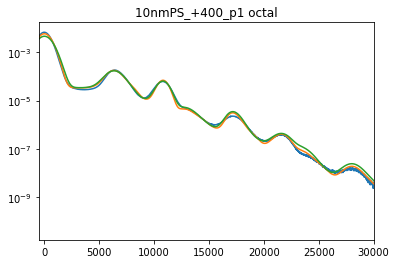

FeCl3PS_-400_p1 dual
Fe10um_NPref_p1 dual
copolymeronly_focus_nofilter_p1 octal
copolymeronly_focus_nofilter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 3.38905868
    reduced chi-square = 9.5790e-04
    Akaike info crit   = -24657.2809
    Bayesian info crit = -24589.3623
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6157.89940 (init = 6405)
    Escatter:         10439.5857 (init = 10989.04)
    Escatter2:        8604.80652 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          9.0812e-08 (init = 1e-05)
    pscatter:         8.8996e-05 (init = 0.01)
    pscatter2:        3.1313e-06 (init = 0.0001)
    pbeta:            0.07520112 (init = 0.15)
    sigma:            381.345496 (init = 200)

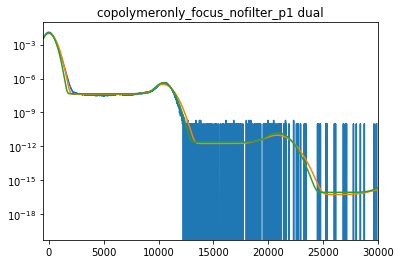

copolymeronly_focus_nofilter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 11.2359395
    reduced chi-square = 0.00317579
    Akaike info crit   = -20403.5726
    Bayesian info crit = -20335.6539
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6558.02287 (init = 6405)
    Escatter:         10730.4766 (init = 10989.04)
    Escatter2:        8609.50323 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          1.7400e-07 (init = 1e-05)
    pscatter:         0.23730764 (init = 0.01)
    pscatter2:        5.8373e-04 (init = 0.0001)
    pbeta:            0.28959989 (init = 0.15)
    sigma:            657.966755 (init = 600)
    M:                50 (fixed)
    scale:            7.88565596 (init = 7.540068)
    p:                0.5585

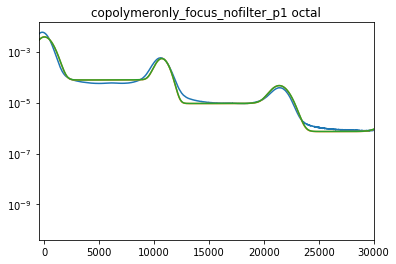

<ipython-input-39-98921a186ae0>:12: RuntimeWarning: invalid value encountered in less
  [(pe > 0.00035), (np.abs(e - np.nanmean(e)) < np.nanstd(e))]


10nmCo_focus_nofilter_p1 dual
FeCl3PS_focus_nofilter_p1 dual
20nmcopolymer_unknown_p1 dual
20nmPS_focus_nofilter_p1 dual
10nmPMMAold_p1 dual
Fe10um_NPref_p1 octal
Fe10um_NPref_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 148
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.99613142
    reduced chi-square = 5.6420e-04
    Akaike info crit   = -26535.9128
    Bayesian info crit = -26467.9941
##  Warning: uncertainties could not be estimated:
    Escatter2:        at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6312.68953 (init = 6405)
    Escatter:         11049.1500 (init = 10990.29)
    Escatter2:        8609.99982 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01843679 (init = 0.02040946)
    pscatter:         1.9292e-05 (init = 0.0001)
    pscatter2:        2.1619e-05 (init = 0.0001)
    pbeta:        

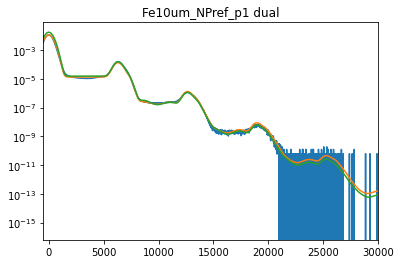

Fe10um_NPref_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 6.20230600
    reduced chi-square = 0.00175305
    Akaike info crit   = -22512.3755
    Bayesian info crit = -22444.4568
##  Warning: uncertainties could not be estimated:
    Escatter2:        at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6262.56045 (init = 6405)
    Escatter:         10712.4594 (init = 10990.29)
    Escatter2:        8609.99771 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.05081754 (init = 0.0592519)
    pscatter:         2.6503e-04 (init = 0.0001)
    pscatter2:        2.4121e-04 (init = 0.0001)
    pbeta:            0.24127940 (init = 0.15)
    sigma:            582.623574 (init = 600)
    M:                50 (fixed)
    scale:            9.39361850 (init = 8.134312)
    

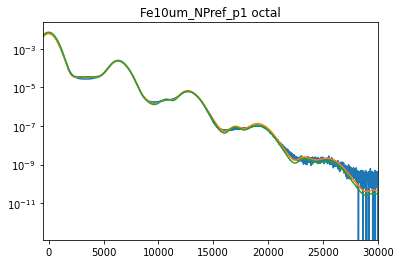

FeCl3PS_-400_p1 octal
FeCl3PS_-400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 137
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.54655586
    reduced chi-square = 4.3713e-04
    Akaike info crit   = -27441.5487
    Bayesian info crit = -27373.6300
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6330.66566 (init = 6405)
    Escatter:         10438.5657 (init = 10987.96)
    Escatter2:        8482.57521 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01140950 (init = 0.01326728)
    pscatter:         1.8391e-04 (init = 0.0001)
    pscatter2:        8.9913e-04 (init = 0.0001)
    pbeta:            0.21706170 (init = 0.15)
    sigma:            365.386475 (init = 200)
    M:                50 (fixed)
    scale:            9.94723388 

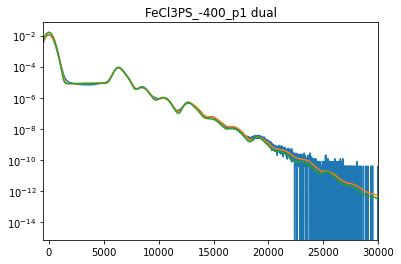

FeCl3PS_-400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.68251533
    reduced chi-square = 0.00132349
    Akaike info crit   = -23509.9487
    Bayesian info crit = -23442.0301
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6276.77991 (init = 6405)
    Escatter:         10796.2172 (init = 10987.96)
    Escatter2:        8030.57826 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.03402237 (init = 0.05781303)
    pscatter:         0.00992555 (init = 0.0001)
    pscatter2:        0.00287898 (init = 0.0001)
    pbeta:            0.29999933 (init = 0.15)
    sigma:            602.072697 (init = 600)
    M:                50 (fixed)
    scale:            9.02214929 (init = 7.907283)
   

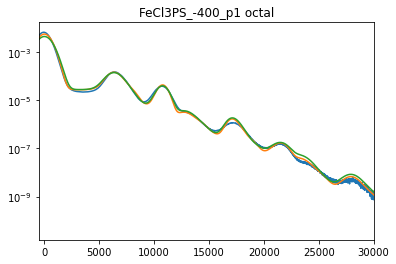

10nmPS_focus_far_nofilter_p1 dual
FeCl3PS_focus_nofilter_p1 octal
FeCl3PS_focus_nofilter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 97
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.63231245
    reduced chi-square = 4.6137e-04
    Akaike info crit   = -27250.0189
    Bayesian info crit = -27182.1002
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6325.66002 (init = 6405)
    Escatter:         10458.5344 (init = 10990.38)
    Escatter2:        8511.77924 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01450962 (init = 0.01625021)
    pscatter:         2.5252e-04 (init = 0.0001)
    pscatter2:        0.00108499 (init = 0.0001)
    pbeta:            0.16491680 (init = 0.15)
    sigma:            364.198665 (init = 200)
    M:                50 (fixed)
    scale:    

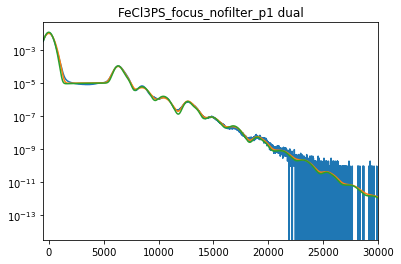

FeCl3PS_focus_nofilter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.39097705
    reduced chi-square = 6.7580e-04
    Akaike info crit   = -25895.3499
    Bayesian info crit = -25827.4313
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6319.57788 (init = 6405)
    Escatter:         11114.5025 (init = 10990.38)
    Escatter2:        8430.63726 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.45997519 (init = 1.97642)
    pscatter:         1.09229801 (init = 0.0001)
    pscatter2:        0.09883864 (init = 0.0001)
    pbeta:            0.15515820 (init = 0.15)
    sigma:            540.432433 (init = 600)
    M:                50 (fixed)
    scale:            10.6649119 (init = 8.644875)
    p:                0.799794

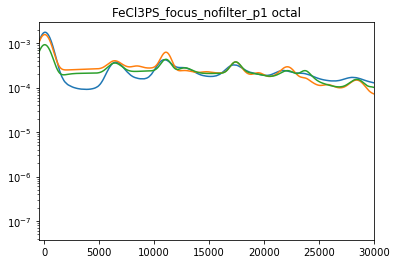

20nmcopolymer_unknown_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 166
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.02791802
    reduced chi-square = 5.7318e-04
    Akaike info crit   = -26479.8434
    Bayesian info crit = -26411.9248
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6319.76532 (init = 6405)
    Escatter:         10441.2208 (init = 10990.76)
    Escatter2:        8381.98134 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00670760 (init = 0.007791477)
    pscatter:         2.5106e-04 (init = 0.0001)
    pscatter2:        4.1143e-05 (init = 0.0001)
    pbeta:            0.15551857 (init = 0.15)
    sigma:            359.092512 (init = 200)
    M:                50 (fixed)
    scale:            10.5465513 (init = 9.27

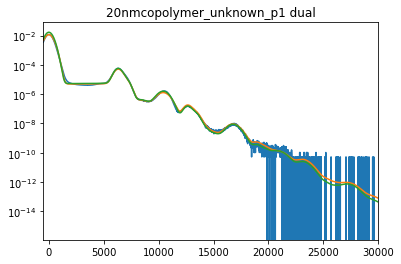

20nmcopolymer_unknown_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 180
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.96708198
    reduced chi-square = 0.00140392
    Akaike info crit   = -23300.5680
    Bayesian info crit = -23232.6494
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6310.73978 (init = 6405)
    Escatter:         10863.7370 (init = 10990.76)
    Escatter2:        7941.70335 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02189384 (init = 0.050882)
    pscatter:         0.01314511 (init = 0.0001)
    pscatter2:        0.00294949 (init = 0.0001)
    pbeta:            0.29999998 (init = 0.15)
    sigma:            628.125923 (init = 600)
    M:                50 (fixed)
    scale:            9.69909693 (init = 8.1901

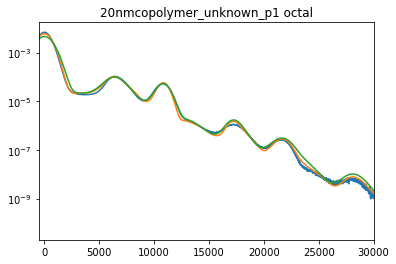

10nmCo_focus_nofilter_p1 octal
10nmCo_focus_nofilter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 127
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.39819696
    reduced chi-square = 6.7784e-04
    Akaike info crit   = -25884.6494
    Bayesian info crit = -25816.7307
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6349.91266 (init = 6405)
    Escatter:         10439.7708 (init = 10989.23)
    Escatter2:        8478.24641 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          3.5206e-04 (init = 0.0003045723)
    pscatter:         5.4136e-06 (init = 0.0001)
    pscatter2:        2.8567e-06 (init = 0.0001)
    pbeta:            0.09877484 (init = 0.15)
    sigma:            377.308647 (init = 200)
    M:                50 (fixed)
    scale:   

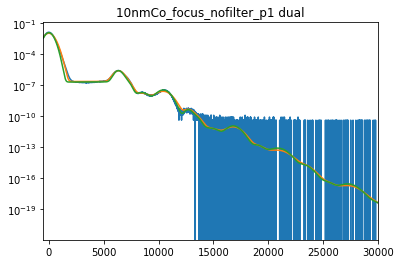

10nmCo_focus_nofilter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 10.7578232
    reduced chi-square = 0.00304065
    Akaike info crit   = -20557.8983
    Bayesian info crit = -20489.9797
##  Warning: uncertainties could not be estimated:
    Escatter2:        at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6149.48909 (init = 6405)
    Escatter:         10755.8696 (init = 10989.23)
    Escatter2:        8609.94156 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02570873 (init = 0.09742528)
    pscatter:         0.05075341 (init = 0.0001)
    pscatter2:        0.00157003 (init = 0.0001)
    pbeta:            0.12535065 (init = 0.15)
    sigma:            600.392140 (init = 600)
    M:                50 (fixed)
    scale:            8.05284288 (init = 7.15

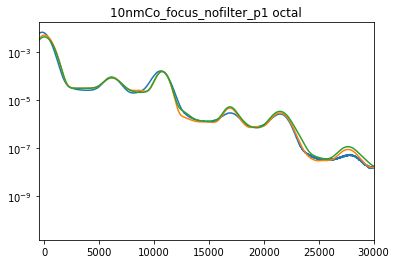

10nmPS_short_p1 dual
10nmPMMAold_p1 octal
10nmPMMAold_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 125
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.86096152
    reduced chi-square = 5.2599e-04
    Akaike info crit   = -26784.7605
    Bayesian info crit = -26716.8419
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6322.04389 (init = 6405)
    Escatter:         10440.9898 (init = 10990.52)
    Escatter2:        8447.96405 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01202112 (init = 0.014201)
    pscatter:         6.8211e-04 (init = 0.0001)
    pscatter2:        1.6920e-04 (init = 0.0001)
    pbeta:            0.15776759 (init = 0.15)
    sigma:            357.930622 (init = 200)
    M:                50 (fixed)
    scale:      

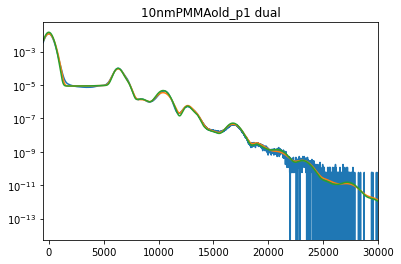

10nmPMMAold_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.20182055
    reduced chi-square = 0.00118763
    Akaike info crit   = -23894.3677
    Bayesian info crit = -23826.4490
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6298.81838 (init = 6405)
    Escatter:         10849.6285 (init = 10990.52)
    Escatter2:        7912.14962 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.04060582 (init = 0.09103363)
    pscatter:         0.02316630 (init = 0.0001)
    pscatter2:        0.00515651 (init = 0.0001)
    pbeta:            0.29999975 (init = 0.15)
    sigma:            623.253966 (init = 600)
    M:                50 (fixed)
    scale:            9.60067426 (init = 8.197751)
    

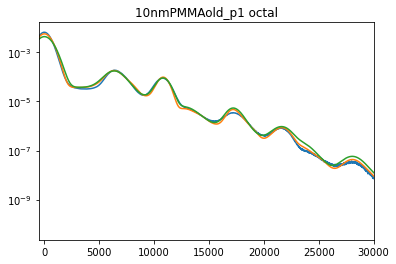

10nmPS_short_p1 octal
10nmPS_short_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 97
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.47854911
    reduced chi-square = 4.1791e-04
    Akaike info crit   = -27601.1442
    Bayesian info crit = -27533.2256
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6316.72214 (init = 6405)
    Escatter:         10492.1435 (init = 10990.32)
    Escatter2:        8487.68126 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01524960 (init = 0.01671713)
    pscatter:         7.4011e-05 (init = 0.0001)
    pscatter2:        5.8765e-04 (init = 0.0001)
    pbeta:            0.16996582 (init = 0.15)
    sigma:            366.507195 (init = 200)
    M:                50 (fixed)
    scale:            10.1673808 (init = 9.273315)
    p:           

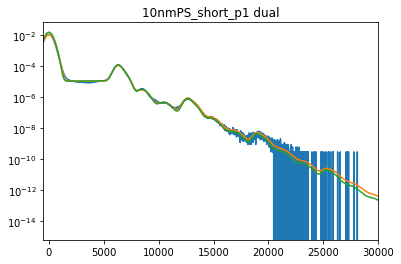

10nmPS_short_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.68984394
    reduced chi-square = 7.6027e-04
    Akaike info crit   = -25477.3449
    Bayesian info crit = -25409.4262
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6286.81201 (init = 6405)
    Escatter:         10817.2280 (init = 10990.32)
    Escatter2:        7999.52740 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.04616732 (init = 0.06999031)
    pscatter:         0.00532668 (init = 0.0001)
    pscatter2:        0.00433169 (init = 0.0001)
    pbeta:            0.29999678 (init = 0.15)
    sigma:            612.840492 (init = 600)
    M:                50 (fixed)
    scale:            9.73274170 (init = 8.23232)
    p:                0.39246511 (init

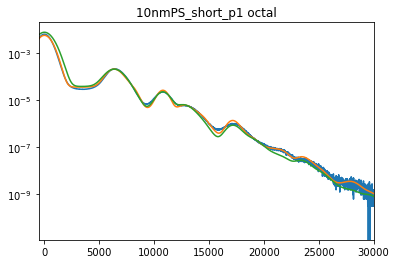

20nmCo_+400_p1 dual
20nmPS_focus_nofilter_p1 octal
20nmPS_focus_nofilter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 114
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.52579716
    reduced chi-square = 7.1391e-04
    Akaike info crit   = -25700.6709
    Bayesian info crit = -25632.7522
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6347.05527 (init = 6405)
    Escatter:         10438.6009 (init = 10988)
    Escatter2:        8511.66325 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00115084 (init = 0.001185402)
    pscatter:         1.7420e-05 (init = 0.0001)
    pscatter2:        9.5741e-05 (init = 0.0001)
    pbeta:            0.09735010 (init = 0.15)
    sigma:            370.462179 (init = 200)
    M:                50 (fixe

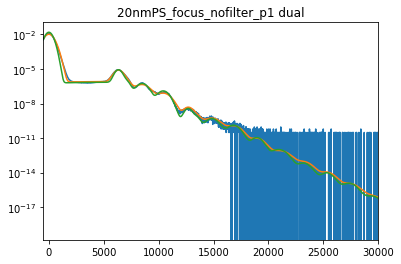

20nmPS_focus_nofilter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 6.00695451
    reduced chi-square = 0.00169784
    Akaike info crit   = -22625.9551
    Bayesian info crit = -22558.0365
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6149.00399 (init = 6405)
    Escatter:         10721.8194 (init = 10988)
    Escatter2:        8609.68559 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.08680387 (init = 0.2220091)
    pscatter:         0.09101495 (init = 0.0001)
    pscatter2:        0.00605487 (init = 0.0001)
    pbeta:            0.15973458 (init = 0.15)
    sigma:            595.295584 (init = 600)
    M:                50 (fixed)
    scale:            8.77347447 (init = 7.532835)
    p:                0.51830049

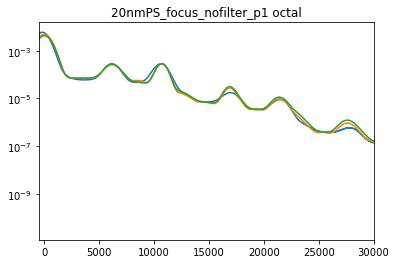

20nmCo_-400_p1 dual
FeCl3PS_+1000_p1 dual
10nmPS_focus_far_nofilter_p1 octal
10nmPS_focus_far_nofilter_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 113
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.83239664
    reduced chi-square = 5.1792e-04
    Akaike info crit   = -26839.6584
    Bayesian info crit = -26771.7398
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6328.78099 (init = 6405)
    Escatter:         10438.8264 (init = 10988.24)
    Escatter2:        8500.63159 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00328193 (init = 0.003295477)
    pscatter:         1.2492e-05 (init = 0.0001)
    pscatter2:        1.0820e-04 (init = 0.0001)
    pbeta:            0.11201710 (init = 0.15)
    sigma:            368.469626 (init = 20

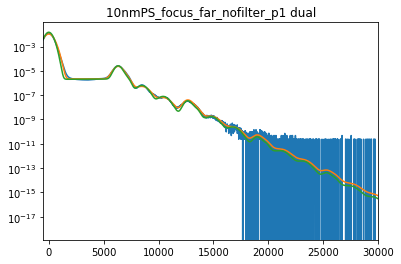

10nmPS_focus_far_nofilter_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 5.63431496
    reduced chi-square = 0.00159251
    Akaike info crit   = -22853.2413
    Bayesian info crit = -22785.3226
##  Warning: uncertainties could not be estimated:
    Escatter2:        at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6150.91773 (init = 6405)
    Escatter:         10764.8546 (init = 10988.24)
    Escatter2:        8609.97873 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.03879157 (init = 0.06895964)
    pscatter:         0.01916831 (init = 0.0001)
    pscatter2:        8.4358e-04 (init = 0.0001)
    pbeta:            0.16984460 (init = 0.15)
    sigma:            579.780618 (init = 600)
    M:                50 (fixed)
    scale:            8.34549138 (init = 

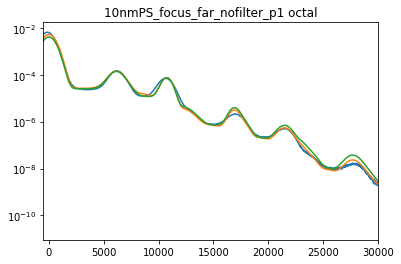

20nmCo_+400_p1 octal
20nmCo_+400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 140
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.99588023
    reduced chi-square = 5.6413e-04
    Akaike info crit   = -26536.3594
    Bayesian info crit = -26468.4408
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6323.49397 (init = 6405)
    Escatter:         10440.6596 (init = 10990.17)
    Escatter2:        8301.24888 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00330064 (init = 0.003590756)
    pscatter:         7.5607e-05 (init = 0.0001)
    pscatter2:        2.2547e-05 (init = 0.0001)
    pbeta:            0.14597176 (init = 0.15)
    sigma:            365.268182 (init = 200)
    M:                50 (fixed)
    scale:            10.2200280 (

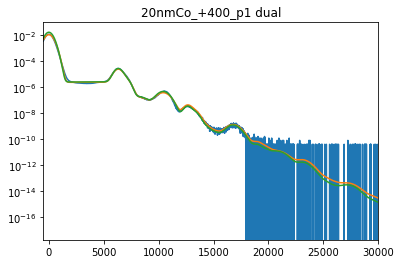

20nmCo_+400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 190
    # data points      = 3549
    # variables        = 11
    chi-square         = 5.27710353
    reduced chi-square = 0.00149155
    Akaike info crit   = -23085.6944
    Bayesian info crit = -23017.7757
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6349.68177 (init = 6405)
    Escatter:         10896.5075 (init = 10990.17)
    Escatter2:        7956.99766 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01081246 (init = 0.02625819)
    pscatter:         0.00718456 (init = 0.0001)
    pscatter2:        0.00163435 (init = 0.0001)
    pbeta:            0.29999997 (init = 0.15)
    sigma:            627.465122 (init = 600)
    M:                50 (fixed)
    scale:            9.64922706 (init = 8.1559)
    p:

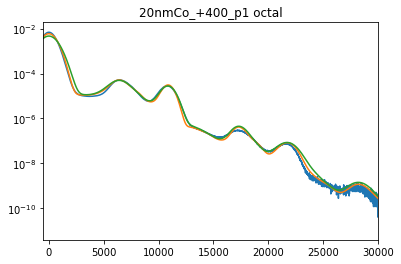

20nmCo_-400_p1 octal
20nmCo_-400_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 151
    # data points      = 3549
    # variables        = 11
    chi-square         = 1.96210325
    reduced chi-square = 5.5458e-04
    Akaike info crit   = -26596.9344
    Bayesian info crit = -26529.0158
##  Warning: uncertainties could not be estimated:
    Escatter:         at boundary
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6317.56339 (init = 6405)
    Escatter:         10439.4016 (init = 10988.84)
    Escatter2:        8072.94345 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.00425820 (init = 0.004892316)
    pscatter:         1.0563e-04 (init = 0.0001)
    pscatter2:        4.7245e-05 (init = 0.0001)
    pbeta:            0.18281739 (init = 0.15)
    sigma:            365.586967 (init = 200)
    M:                50 (fixed)
    scale:            10.3307992 (

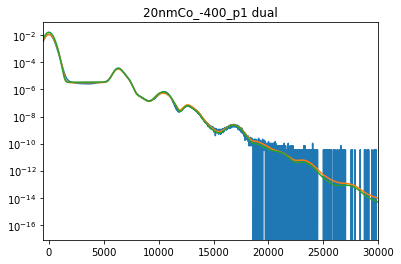

20nmCo_-400_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 190
    # data points      = 3549
    # variables        = 11
    chi-square         = 3.82714444
    reduced chi-square = 0.00108173
    Akaike info crit   = -24225.8405
    Bayesian info crit = -24157.9219
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
    pbeta:            at boundary
[[Variables]]
    Esignal:          6312.27731 (init = 6405)
    Escatter:         10862.6004 (init = 10988.84)
    Escatter2:        7841.39178 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.02331634 (init = 0.04971414)
    pscatter:         0.00802945 (init = 0.0001)
    pscatter2:        0.00633692 (init = 0.0001)
    pbeta:            0.30000000 (init = 0.15)
    sigma:            627.725086 (init = 600)
    M:                50 (fixed)
    scale:            9.96275625 (init = 8.243344)
    

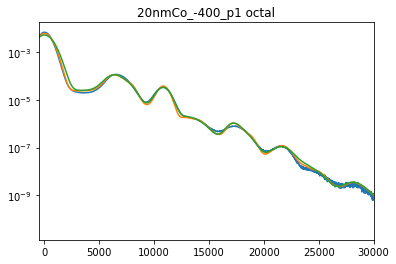

FeCl3PS_+1000_p1 octal
FeCl3PS_+1000_p1 dual
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 97
    # data points      = 3549
    # variables        = 11
    chi-square         = 2.04423186
    reduced chi-square = 5.7779e-04
    Akaike info crit   = -26451.4072
    Bayesian info crit = -26383.4886
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6320.63668 (init = 6405)
    Escatter:         10465.0840 (init = 10990.07)
    Escatter2:        8496.49837 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.01168971 (init = 0.01285882)
    pscatter:         1.6184e-04 (init = 0.0001)
    pscatter2:        8.2028e-04 (init = 0.0001)
    pbeta:            0.13081101 (init = 0.15)
    sigma:            364.060900 (init = 200)
    M:                50 (fixed)
    scale:            10.1406633 (init = 9.275384)
    p:         

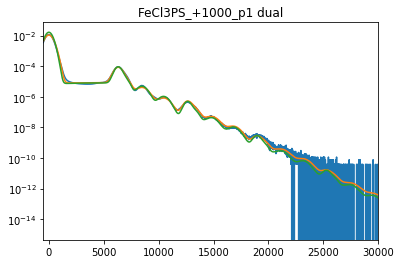

FeCl3PS_+1000_p1 octal
[[Model]]
    Model(_logcomb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 200
    # data points      = 3549
    # variables        = 11
    chi-square         = 4.31779883
    reduced chi-square = 0.00122041
    Akaike info crit   = -23797.7360
    Bayesian info crit = -23729.8174
##  Warning: uncertainties could not be estimated:
    Ebeta:            at initial value
[[Variables]]
    Esignal:          6266.66641 (init = 6405)
    Escatter:         10828.9407 (init = 10990.07)
    Escatter2:        8381.95357 (init = 8200)
    Ebeta:            7045.50000 (init = 7045.5)
    psignal:          0.03155061 (init = 0.05336354)
    pscatter:         0.00938244 (init = 0.0001)
    pscatter2:        0.00158318 (init = 0.0001)
    pbeta:            0.29995657 (init = 0.15)
    sigma:            620.158618 (init = 600)
    M:                50 (fixed)
    scale:            9.34217719 (init = 8.13876)
    p:                0.40095607 (ini

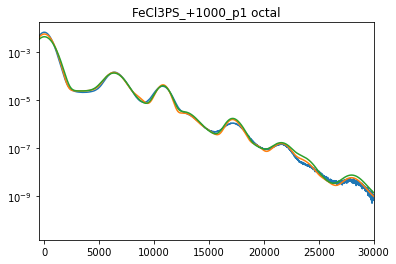

In [90]:

dettiles=[('dual', ['tile0', 'tile1']), ('octal', ['tile3', 'tile4'])]

def escatterfunc(fn,e):
    return np.mean(e)

func=functools.partial(fitfile,dettiles=dettiles,Escatter2=8200,Escatterfunc=escatterfunc,lim=35000)

fns=list(Path('/arcv1/UserData/gorkhover/TAIS2020/nano/p1/final/').glob('*.h5'))
from multiprocessing import Pool
res={}
with Pool(8) as pool:
    for c in pool.imap_unordered(func,fns):
        res.update(c)
        for fn,v in c.items():
            for det,r in v.items():
                f1,f2,x,hist=r

                x1 = x[(x > -500) & (x < 35000)]
                h1=hist[(x > -500) & (x < 35000)]
                print(fn,det)
                print(f1.fit_report())
                print(f2.fit_report())
                plt.semilogy(x, hist)
                plt.semilogy(x1, 10 ** f1.best_fit)
                plt.semilogy(x1, 10 ** f2.best_fit)
                plt.xlim(-500, 30000)
                plt.title(f'{fn} {det}')
                plt.show()
            

        # hists=np.sum(np.array(f['detectors']['dual']['tile0']['hist']['shot'][np.broadcast_to(mask[:,None],f['detectors']['dual']['tile0']['hist']['shot'].shape)]),0)

In [92]:
import pickle
pickle.dump(res,open( "npspectrumfit.pkl", "wb" ) )

In [4]:
import pickle
res=pickle.load( open( "npspectrumfit.pkl", "rb" ) )

In [ ]:

for fn,v in res.items():
    for det,r in v.items():
        f1,f2,x,hist=r

        x1 = x[(x > -500) & (x < 35000)]
        h1=hist[(x > -500) & (x < 35000)]
        print(fn,det)
        print(f1.fit_report())
        print(f2.fit_report())
        plt.semilogy(x, hist)
        plt.semilogy(x1, 10 ** f1.best_fit)
        plt.xlim(-500,40000)
        #plt.xlim(-500, min(30000,x[np.argmin(hist)]))
#         for p in range(0,4):
#             plt.axvline(p*f1.params['Esignal'].value,c='g')
#         for p in range(0,4):
#             plt.axvline(p*f1.params['Escatter'].value,c='r')
#         for p in range(0,4):
#             plt.axvline(p*f1.params['Escatter2'].value,c='y')
        plt.title(f'{fn} {det}')
        plt.show()

In [98]:

for fn,v in res.items():
    for det,r in v.items():
        f1,f2,x,hist=r
        print(f"{fn.ljust(30)} {det.ljust(6)}\t{f1.params['psignal'].value:.2e} @ {int(f1.params['Esignal'].value)}   \t{f1.params['pscatter'].value:.2e} @ {int(f1.params['Escatter'].value)}\t{f1.params['pscatter2'].value:.2e} @ {int(f1.params['Escatter2'].value)}")

FeCl3PS_focus_p1               dual  	1.81e-03 @ 6345   	2.23e-05 @ 10440	1.13e-04 @ 8479
FeCl3PS_focus_p1               octal 	2.18e-02 @ 6333   	4.17e-03 @ 10914	1.33e-03 @ 8168
20nmSpin_p1                    dual  	9.54e-04 @ 6333   	3.08e-04 @ 10496	3.69e-05 @ 7903
20nmSpin_p1                    octal 	6.38e-03 @ 6541   	2.48e-02 @ 10890	4.55e-03 @ 7790
copolymeronly_p1               dual  	3.49e-05 @ 6661   	1.59e-04 @ 10440	1.26e-04 @ 7790
copolymeronly_p1               octal 	1.39e-02 @ 6412   	8.91e-03 @ 10919	6.91e-03 @ 7790
20nmPS_+400_p1                 dual  	9.80e-03 @ 6321   	1.51e-04 @ 10440	8.55e-04 @ 8507
20nmPS_+400_p1                 octal 	2.81e-02 @ 6282   	9.34e-03 @ 10845	2.00e-03 @ 8136
benNi20nm_p1                   dual  	2.26e-03 @ 7338   	6.70e-05 @ 10512	3.31e-04 @ 7792
benNi20nm_p1                   octal 	7.16e-03 @ 7180   	4.13e-03 @ 10965	2.76e-03 @ 7790
benNi40nm_p1                   dual  	4.07e-03 @ 7327   	6.81e-05 @ 10555	6.58e-04 @ 7790
benNi40nm_

In [102]:
import itertools
import pandas as pd
keys=['Esignal',
 'Escatter',
 'Escatter2',
 'Ebeta',
 'psignal',
 'pscatter',
 'pscatter2',
 'pbeta',
 'sigma',
 'M',
 'scale',
 'p',
 'scattersigmamod']

tmp = [['_'.join(fn.split('_')[:-1]), *[v[d][1].params[p].value for d, p in itertools.product(['dual', 'octal'],keys)]] for fn, v in res.items()]
df=pd.DataFrame(tmp,columns=['Name']+[f"{d}_{p}" for d, p in itertools.product(['dual', 'octal'],keys)])
#l=log('sacla2020.csv')
#l.dataframe.columns=l.dataframe.columns.droplevel(1)
#dfj=l.dataframe[25:99].set_index('Name').join(df.set_index('Name'))
df.to_csv('npspectrumfit.csv')

In [100]:
df.iloc[np.argsort(df['octal_psignal']/df['dual_psignal'])]

,Name,dual_Esignal,dual_Escatter,dual_Escatter2,dual_Ebeta,dual_psignal,dual_pscatter,dual_pscatter2,dual_pbeta,dual_sigma,...,octal_Ebeta,octal_psignal,octal_pscatter,octal_pscatter2,octal_pbeta,octal_sigma,octal_M,octal_scale,octal_p,octal_scattersigmamod
15,copolymeronly_focus_nofilter,6157.899395,10439.585707,8604.806524,7045.500000,9.081238e-08,0.000108,7.755321e-07,0.075201,329.123271,...,7045.500000,1.336195e-07,0.238172,5.697527e-04,0.289600,663.857261,564.237724,7.890852,0.558519,0.8
9,10nmPS_-400,6314.328688,10491.226169,8471.925677,7045.500000,1.247602e-02,0.000062,4.955954e-04,0.182994,350.612050,...,7045.500000,2.950454e-02,0.003583,3.632953e-04,0.300000,650.327027,1.180356,13.411874,0.366751,0.8
22,10nmPS_short,6316.722137,10492.143498,8487.681261,7045.500000,1.168841e-02,0.000056,4.487210e-04,0.169966,339.986659,...,7045.500000,3.332655e-02,0.003290,1.212508e-03,0.299997,705.972184,1.347227,14.903120,0.392465,0.8
16,Fe10um_NPref,6312.689534,11049.150005,8609.999817,7045.500000,1.355185e-02,0.000015,2.411925e-05,0.136877,362.293068,...,7045.500000,4.534650e-02,0.000235,1.478042e-04,0.241279,581.326865,2266.044797,11.032329,0.374282,0.8
5,benNi40nm,7327.547185,10555.606725,7790.000094,8091.557704,2.791683e-03,0.000061,5.761391e-04,0.138910,327.418432,...,8601.982299,1.029420e-02,0.003066,5.033229e-03,0.154741,616.973265,9.343028,10.994324,0.401681,0.8
6,20nmPS_-400,6325.276626,10444.537673,8507.221833,7045.500000,9.643920e-03,0.000206,9.506183e-04,0.128731,304.110965,...,7045.500000,3.682827e-02,0.011818,8.118071e-04,0.299814,658.331405,47546.191997,8.185216,0.424292,0.8
3,20nmPS_+400,6321.530875,10440.462947,8507.508484,7045.500000,8.093612e-03,0.000150,7.666029e-04,0.131889,308.983806,...,7045.500000,3.287251e-02,0.010428,9.951328e-04,0.299989,696.388029,6898.240205,8.718554,0.418720,0.8
14,10nmPS_+400,6323.285165,10465.674806,8510.642684,7045.500000,1.059597e-02,0.000345,1.174288e-03,0.144779,315.075822,...,7045.500000,4.678336e-02,0.017892,1.554194e-03,0.300000,689.567416,20180.550688,8.516392,0.434218,0.8
1,20nmSpin,6333.537536,10496.117037,7903.444031,7045.500000,1.189625e-03,0.000643,1.359043e-05,0.201602,327.516909,...,7045.500000,5.293063e-03,0.024315,3.114340e-03,0.299948,746.046859,0.139313,10.646562,0.558459,0.8
27,FeCl3PS_+1000,6320.636676,10465.084045,8496.498372,7045.500000,8.318040e-03,0.000139,6.480612e-04,0.130811,315.861813,...,7045.500000,3.762949e-02,0.011011,7.861301e-04,0.299957,682.807844,11192.393118,8.006383,0.400956,0.8


# by sample position

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


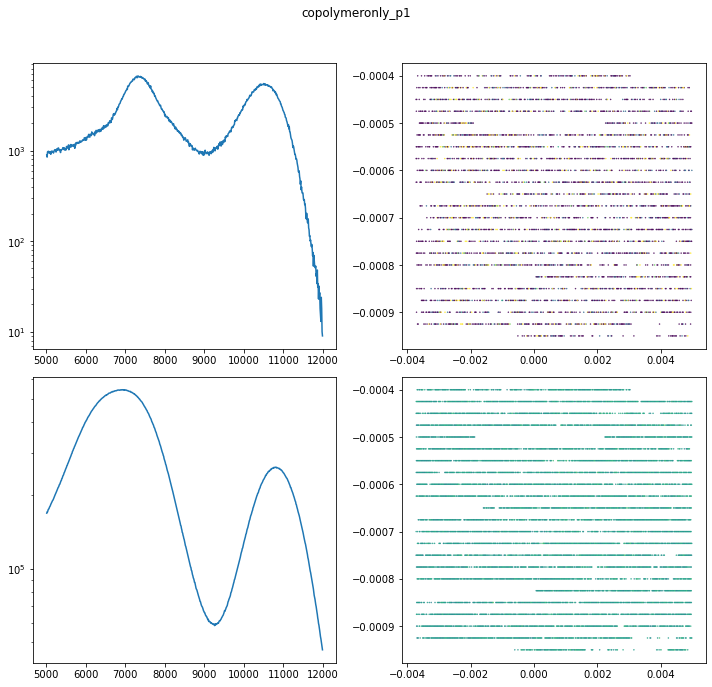

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


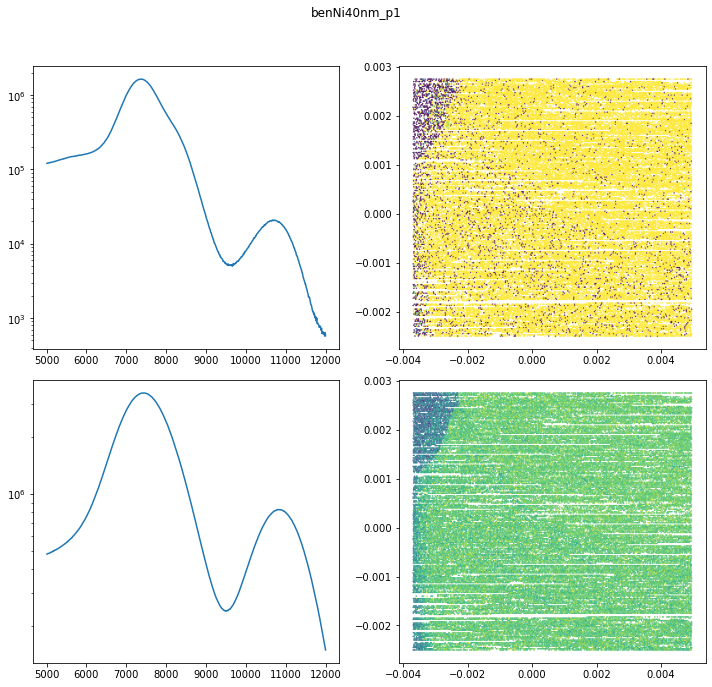

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


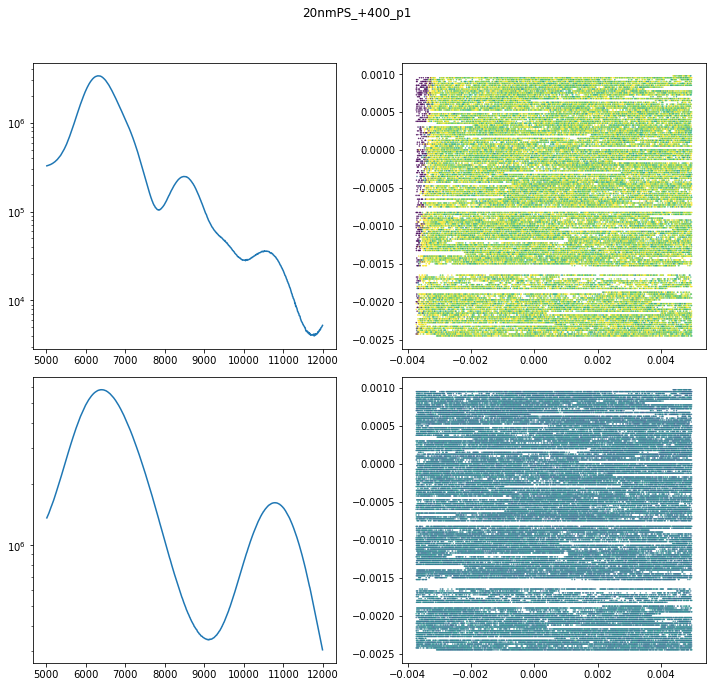

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


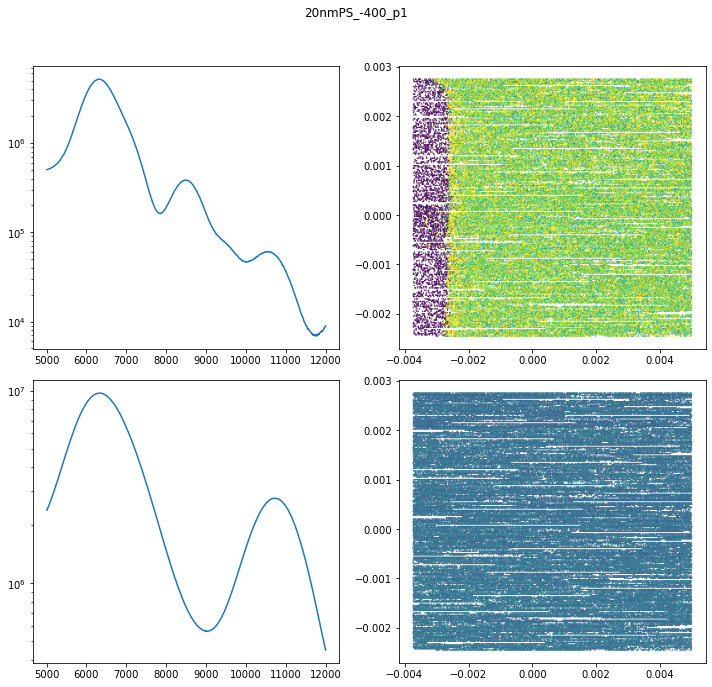

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


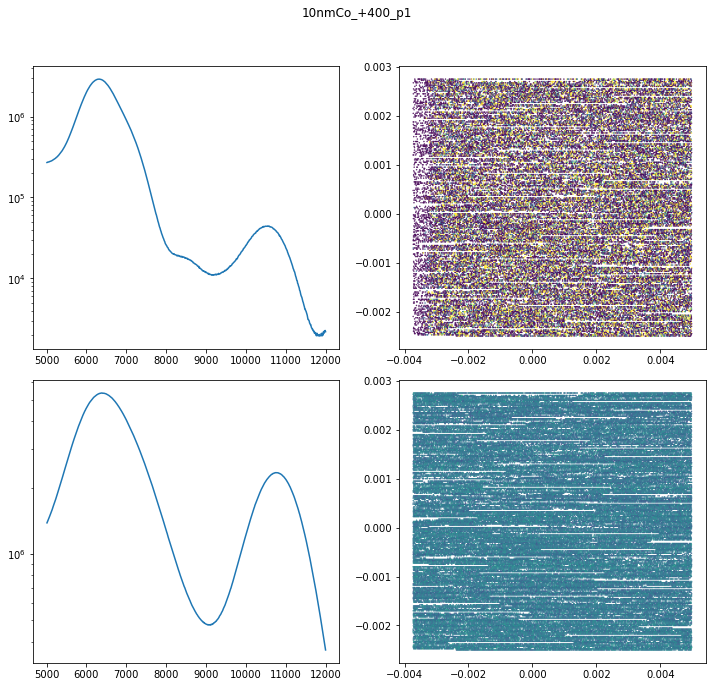

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


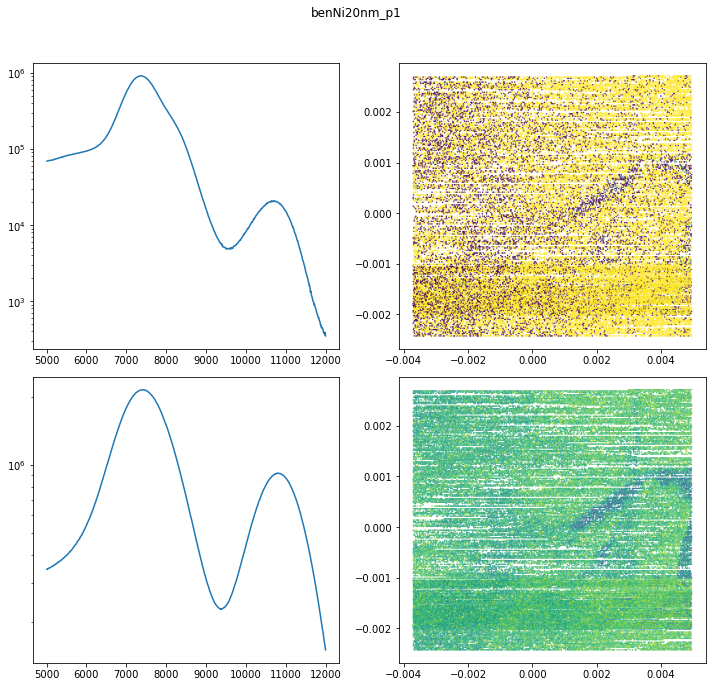

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


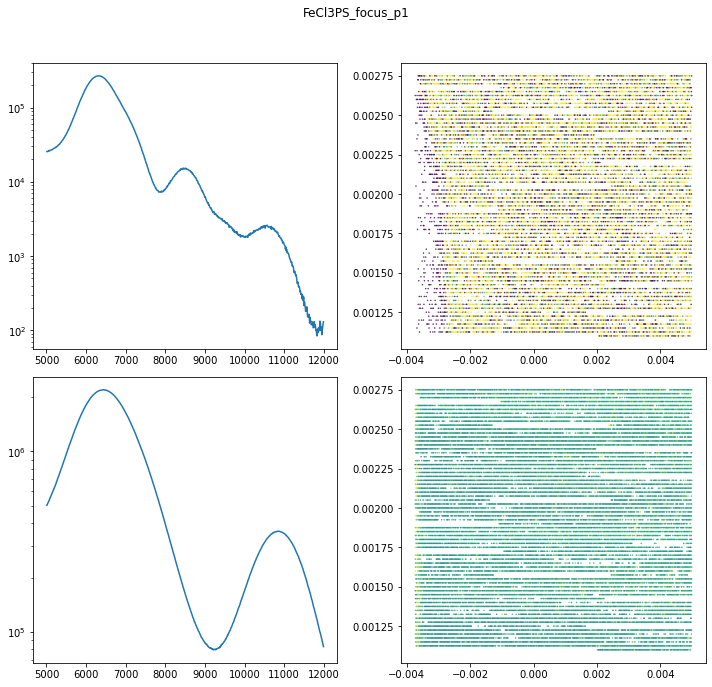

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


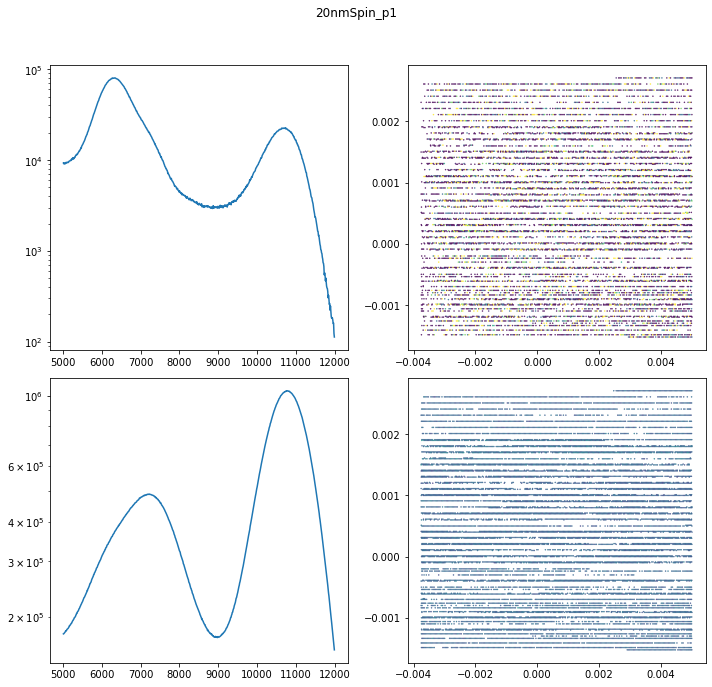

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


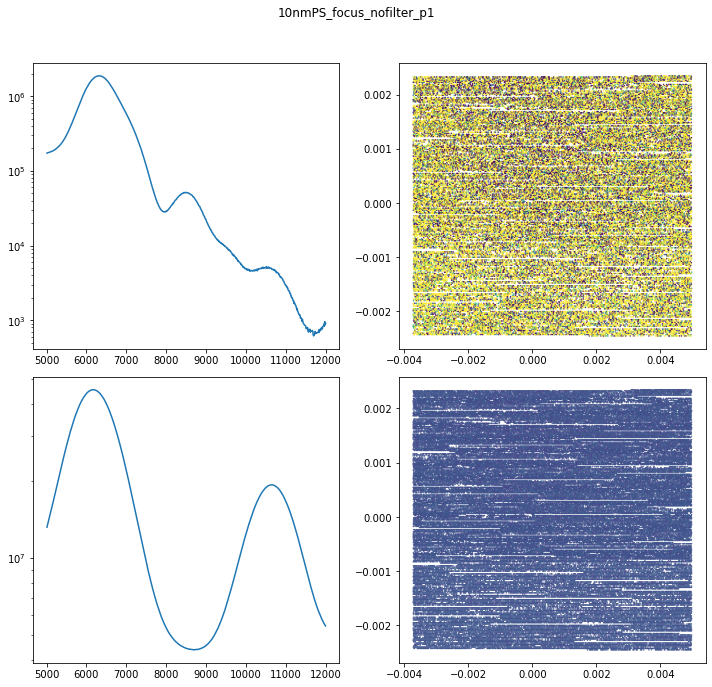

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


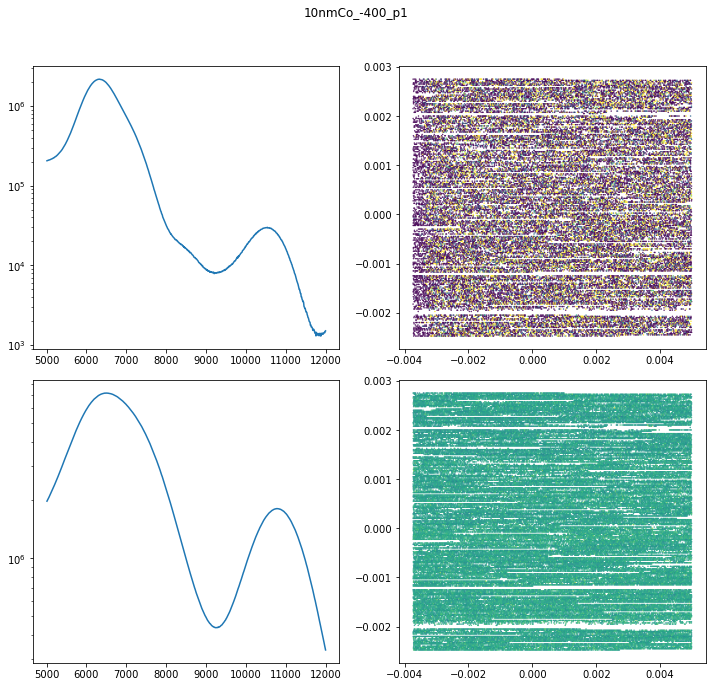

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


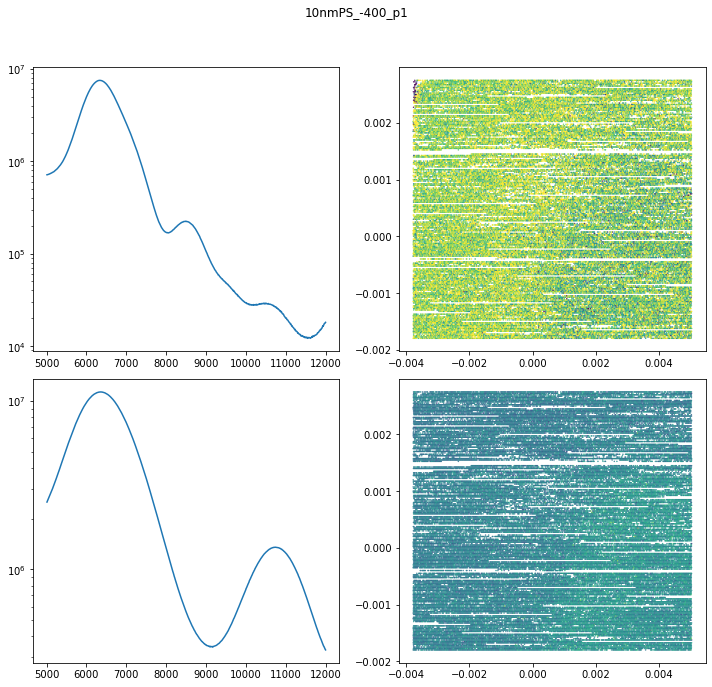

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


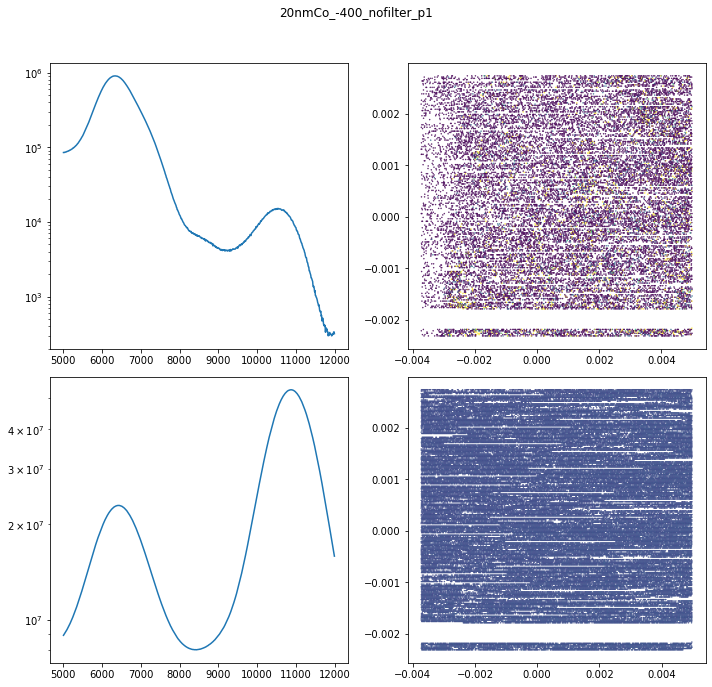

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


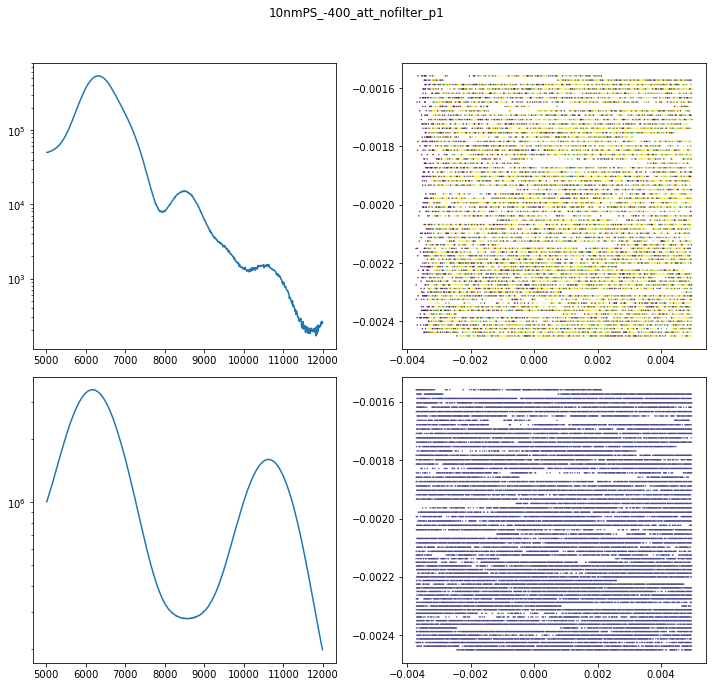

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


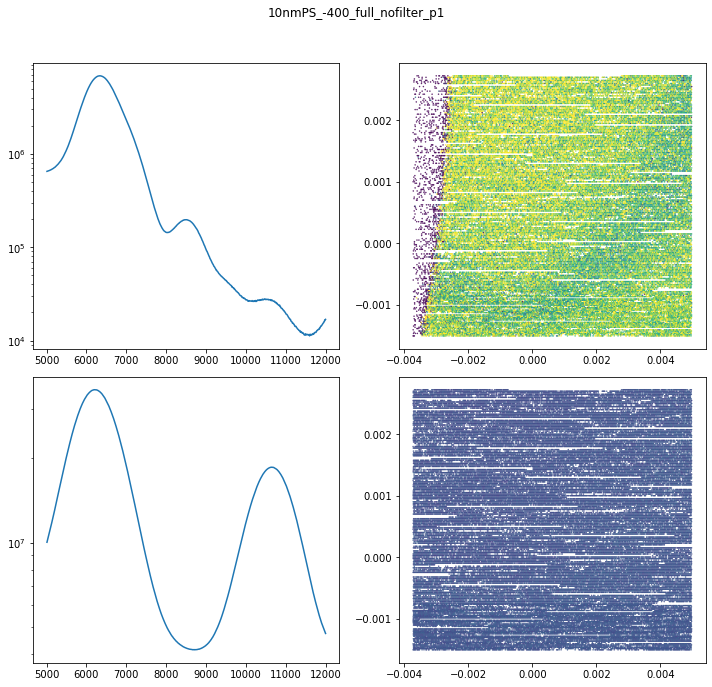

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


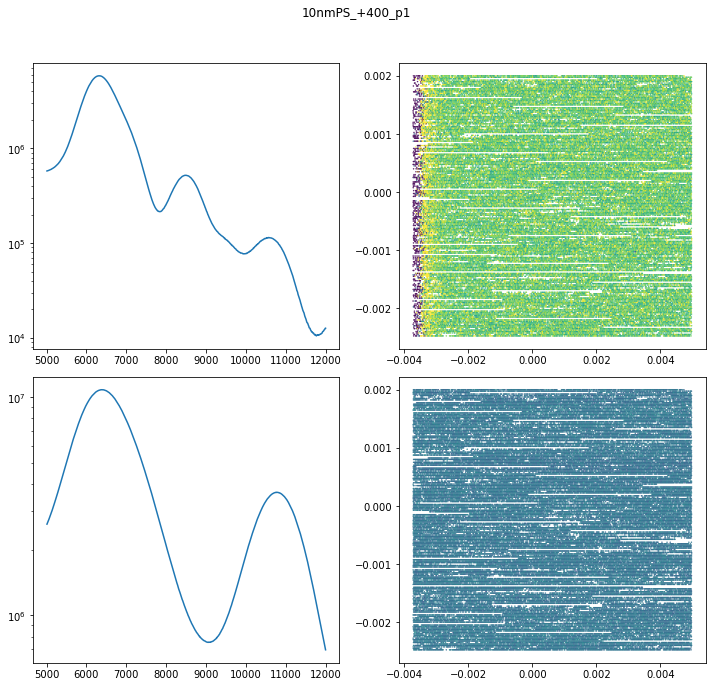

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


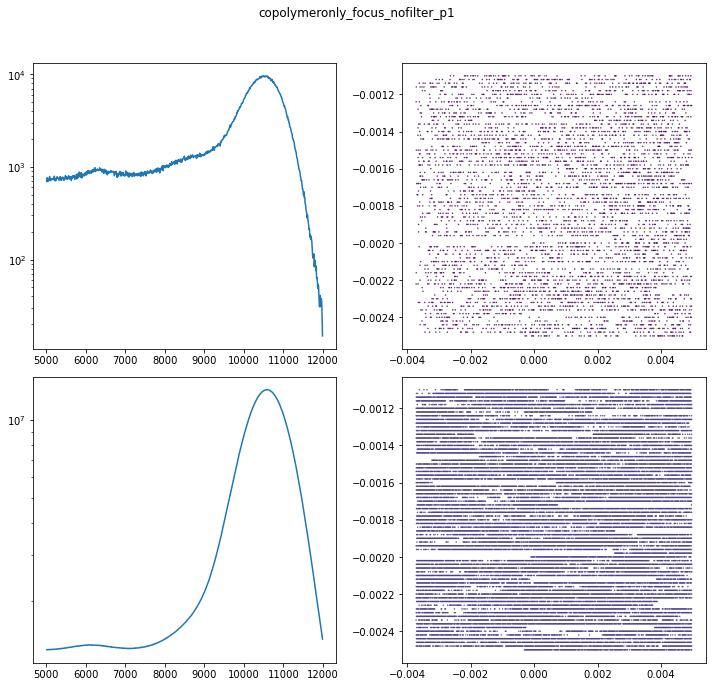

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


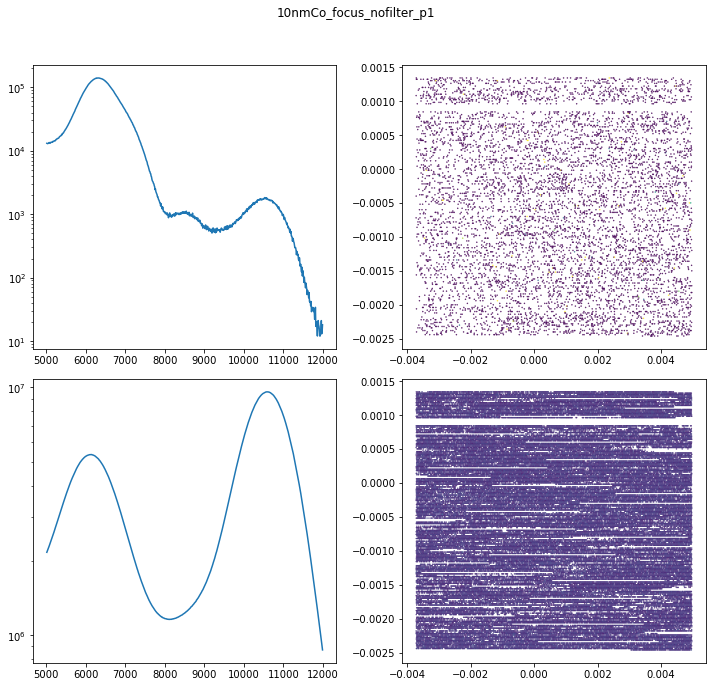

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


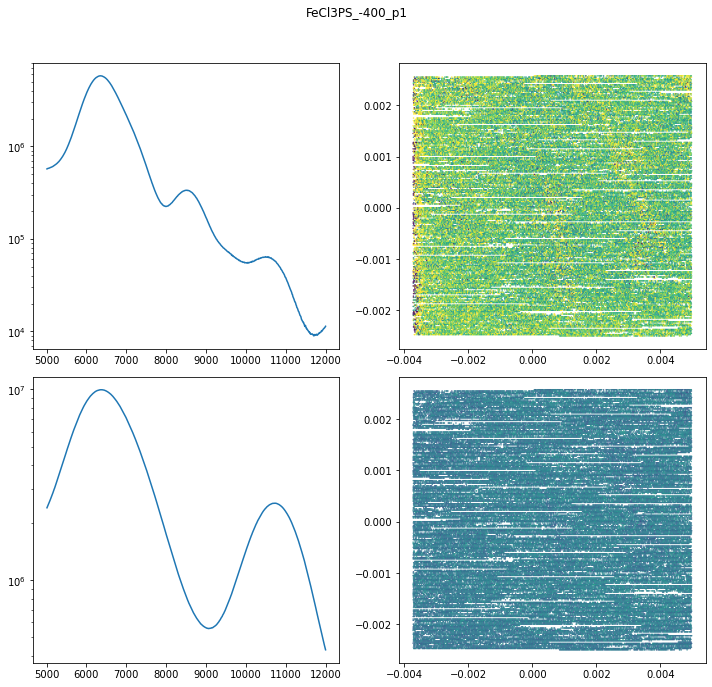

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


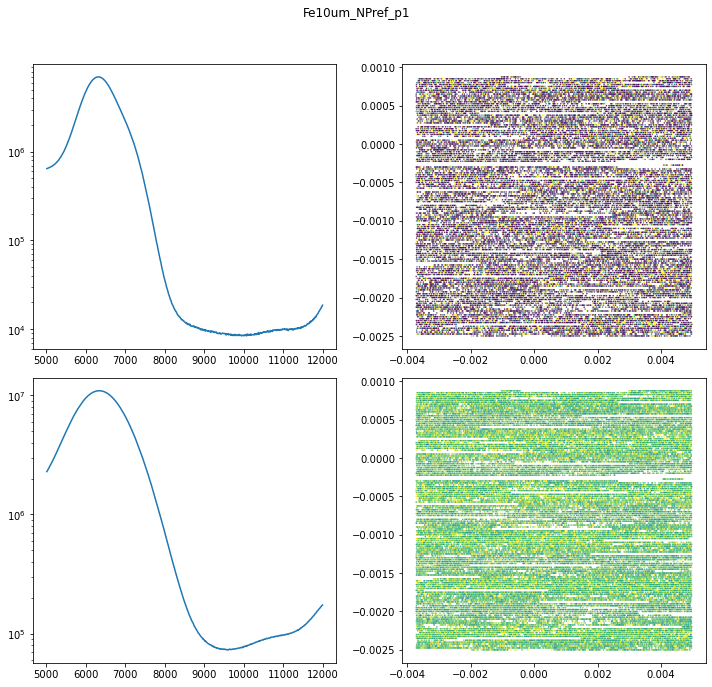

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


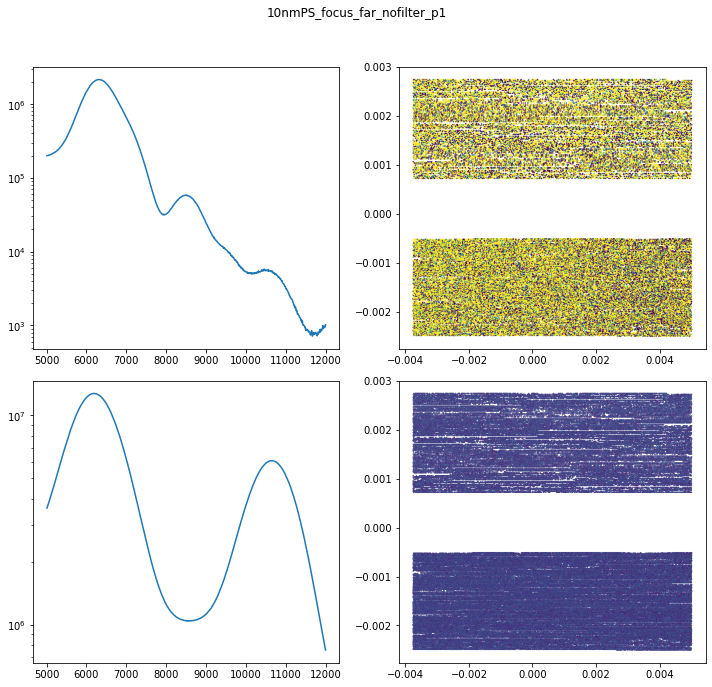

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


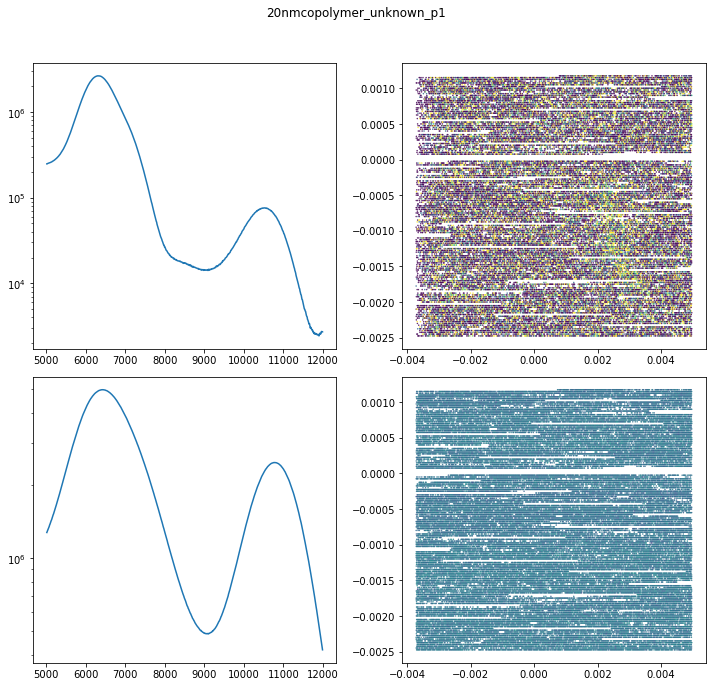

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


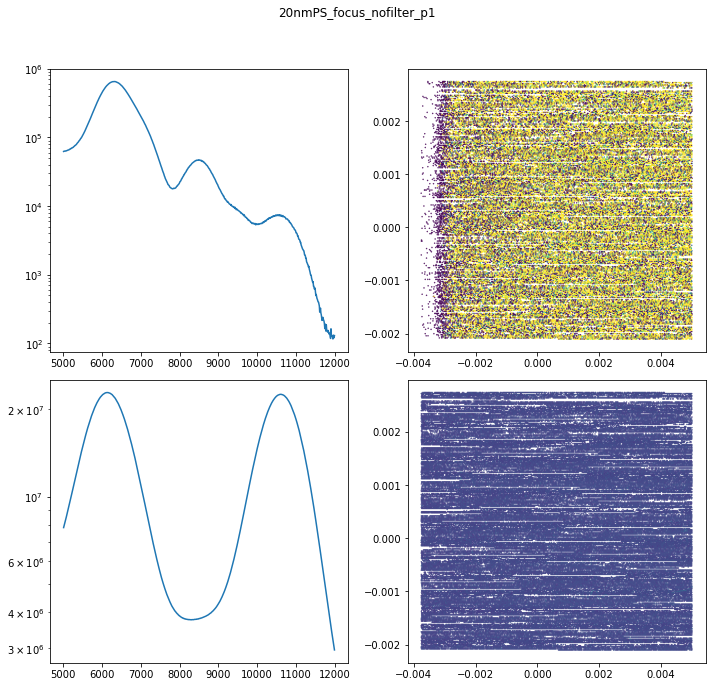

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


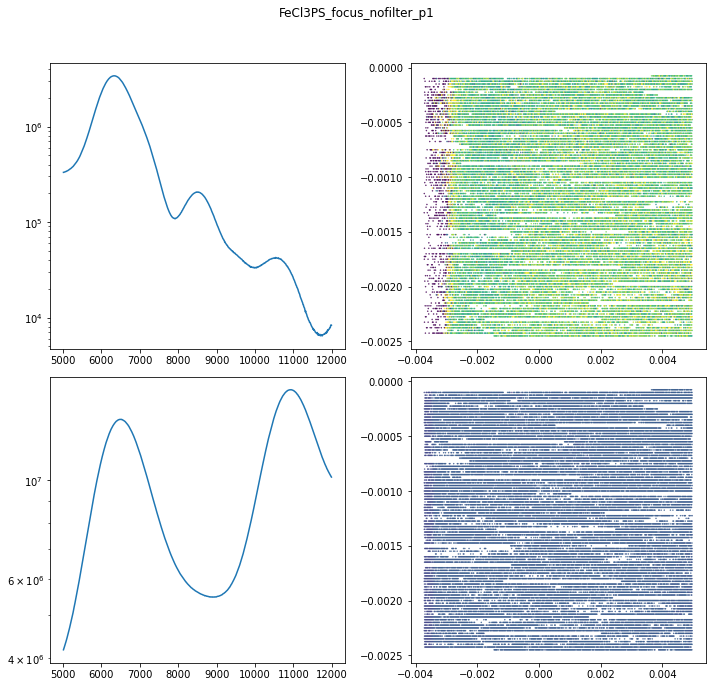

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


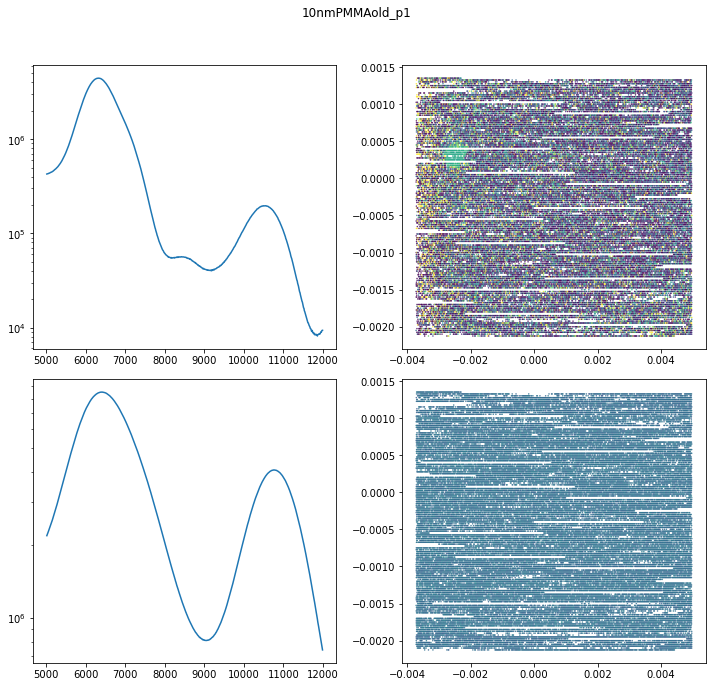

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


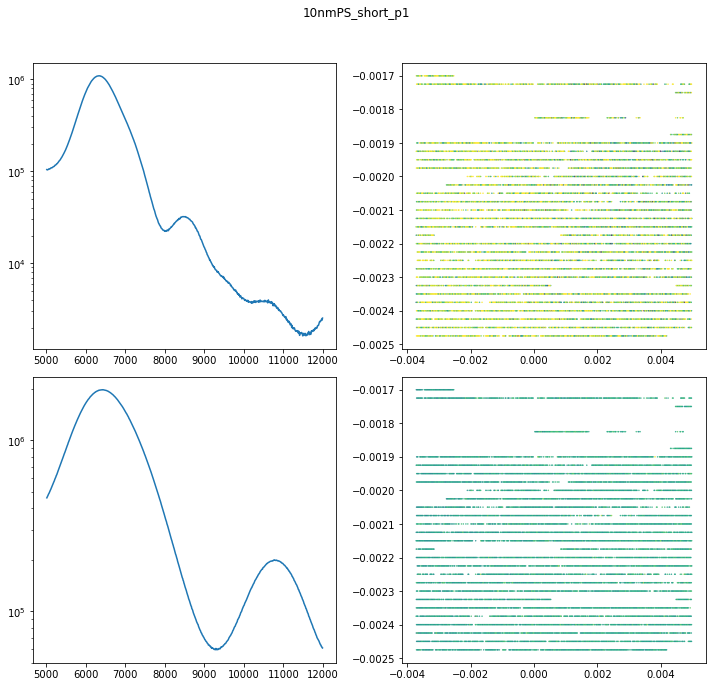

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


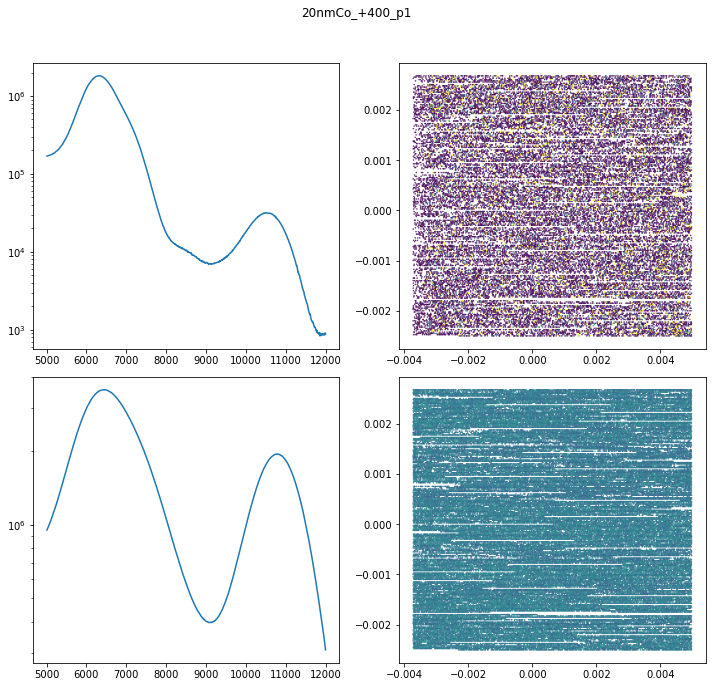

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


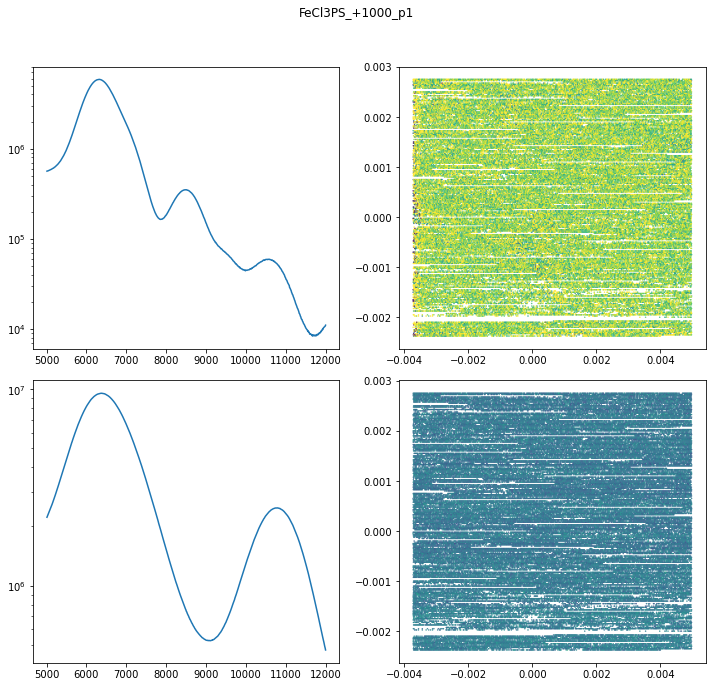

<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in log10
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: divide by zero encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
<ipython-input-175-a00f16910968>:18: RuntimeWarning: invalid value encountered in true_divide
  ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))


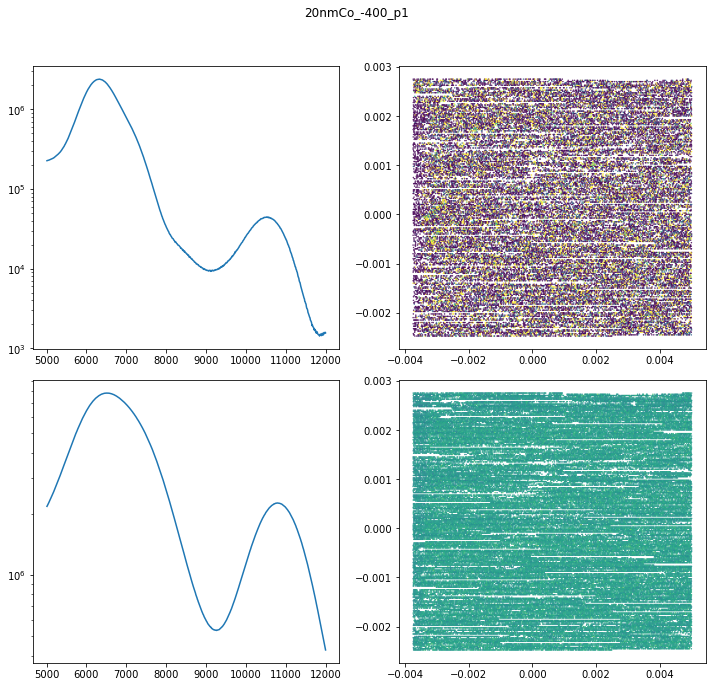

In [175]:
tmp={}
for fn in Path('/arcv1/UserData/gorkhover/TAIS2020/nano/p1/parts/').glob('*.h5'):
    with h5py.File(fn) as f:
        x=np.array(f['motors/sampleX'])
        z=np.array(f['motors/sampleZ'])
        fig,axs=plt.subplots(2,2,figsize=(10,10))

        for det,axc in zip(['dual','octal'],axs):
            ax1,ax2=axc
            bins=np.array(f['detectors'][det]['tile0']['hist']['bincenters'])
            binids=np.nonzero((bins>5000) & (bins<12000))

            hist=0
            tiles=f['detectors'][det].keys() if det=='dual' else ['tile3','tile4']
            hist=sum([np.array(f['detectors'][det][tile]['hist']['shot'][:,binids[0].tolist()]) for tile in tiles])

            sil,sih,bgl,bgh=np.searchsorted(bins[binids],[8390,8480,9080,9200])
            ratio=np.log10(hist[:,sil:sih].sum(1))/np.log10(hist[:,bgl:bgh].sum(1))
            tmp[str(fn.stem)]=(np.array(bins[binids]),np.array(hist))
            ax1.semilogy(bins[binids],hist.sum(0))
            ax2.scatter(x,z,s=0.2,c=ratio,vmax=1.4,vmin=0.8)
        fig.suptitle(fn.stem)
        fig.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()